# Coursework #2 AI for Sustainable Development

## Coursework overview
Coursework #2 is a data analysis coding-based coursework. You are asked to choose a dataset related to sustainable development and do some machine learning based analysis. We will detail this more in the next sections.

You can choose an application/dataset from the ones we analysed in the first coursework or choose a completely new dataset: 
* **Option 1**: Choose a dataset from the SustainBench paper (which includes 15 datasets related to sustainable development), please do not choose the climate action one related to brick kilns, as we will use it in class.
You can choose the same dataset that you use in coursework #1. Please note that the authors from SustainBench have a GitHub project with data loaders, preprocessing code and baselines for these datasets here: https://github.com/sustainlab-group/sustainbench
* **Option 2**: Choose an alternative dataset of your choice (e.g. that you are interested in). Please if you choose this option motivate the dataset's relationship to sustainable development. If the dataset is part of an online competition (e.g. in Kaggle, Zindi, etc), please make sure to include information that makes us discern what you have built, vs what was built from someone else (since in some cases participants of the competition submit tutorials, etc). 

Please do NOT choose the same dataset that you used as part of a different coursework for a different module (which may be possible as the coursework is up to some extent open ended), as this would be considered self-plagiarism. 

Once you have chosen your dataset we will ask you to do the following: 
1. Do some **exploratory data analysis** to get some insights about the dataset. We do not give specific guidelines here as this may depend on the dataset itself, but we ask you to justify your choices and the results of your analysis.
2. Think about the **task that the dataset is most suitable for** and discuss what would be the most **appropriate evaluation criteria** for such a machine learning task. For example, you may have a dataset where songs are labelled with different music genres. Perhaps the task for which the dataset is most suitable for is to build a multi label prediction model that can classify new songs, and the most appropriate evaluation metric could be the hamming loss (commonly used in multi label prediction, which could be used both as inspiration for a training objective for neural networks, or simply as the evaluation criteria for model selection and hyperparameter tuning). 
3. **Design and implement a machine learning system/pipeline**. This could be either supervised or unsupervised. In either case, the pipeline you choose needs to be aligned with the task you defined before. 
4. **Design a set of experiments** and discuss how these fit with the questions that the dataset aims to address. Do a **performance & scalability analysis** of your model.
5. Analyse and discuss some of the **ethical implications**, in connection with your exploratory data analysis and model performance (e.g. do you appreciate any imbalances in the data or initial biases that can be problematic?).
6. Discuss **sustainable development relevance & impact**.

We ask your code to be in python, but beyond that we do not mind what packages you use. 

For grading, we will not check your code in depth (beyond perhaps checking that it's doing what you describe). Instead, our focus will be on grading the analysis you have done, how well it's motivated and justified, how insightful it was, how do you interpret the results in terms of impact and sustainable development, etc.

**Submission**: You do not have to submit your dataset and notebook to the coursework submission. Simply run the analysis in jupyter notebooks and then export the notebook as html or pdf. You can then submit this html/pdf file in moodle. 

### 1. Previous work (5%)

**Guidelines**: We first ask you to summarise what has been done before with this dataset. While this is not specifically necessary for the purpose of the coursework, it is important for us to mark the novelty of your analysis, specially since many of these datasets come with associated baselines in the GitHub link we shared before. While we encourage you to compare to what has been done before we will evaluate whether you explored new approaches. Please give us in this section a brief introduction to the dataset and to the previous models that were built before using the data (you do not need to go over all models that were proposed before, you can just focus on the one with the best performance). Tell us whether these models were publicly available, and if so where to find them. It is crucial that in the next sections you justify how your analysis differs from this previous work.


<span style="color:red; font-weight:bold;">
Gdoc 1
</span>

 

### 2. Exploratory data analysis (15%)

**Guidelines**: Load the dataset and answer the following questions: 
* What are the characteristics of your dataset? Do you see any trends in the data? (5%)
* Are there any challenges with the data? (missing values, outliers, imbalanced classes, biases, etc...) (5%)
* Does the data need any pre-processing to successfully apply standard machine learning models? If so, what kind? Please do the pre-processing that you consider necessary. (5%)

You can use descriptive statistics here, figures/plots, etc. 


In [1]:
from concurrent.futures import ThreadPoolExecutor
import os, glob

import numpy as np
import pandas as pd
import sklearn
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
dataset_root_dir = "C:/UCL Coursework/Sem 1/COMP0173/sustainbench/dataset/poverty" 
street_level_image_folder  = f"{dataset_root_dir}/mapillary/imagery"
street_level_metadata_folder  = f"{dataset_root_dir}/metadata"
street_level_image_path = glob.glob(os.path.join(street_level_image_folder, "**/*.jpeg"), recursive=True)

### Load satelite data
df = pd.read_csv(os.path.join(dataset_root_dir, 'dhs_final_labels.csv'))

df['labels'] = df['asset_index']/5
df = df[~df['labels'].isna()]

df['survey'] = df['DHSID_EA'].str[:10]
df['cc'] = df['DHSID_EA'].str[:2]
# df['path'] = r'C:\UCL Coursework\Sem 1\COMP0173\sustainbench\dhs\dhs_AL_DR/'+ df['survey'] + '/' + df['DHSID_EA'] + '.npz'
df['path'] = dataset_root_dir + '/dhs_npzs/' + df['survey'] + '/' + df['DHSID_EA'] + '.npz'
path_years = df[['DHSID_EA', 'path', 'year']].apply(tuple, axis=1)
df.set_index('DHSID_EA', verify_integrity=True, inplace=True)
print(df['path'].iloc[0])
display(df.head())


C:/UCL Coursework/Sem 1/COMP0173/sustainbench/dataset/poverty/dhs_npzs/AL-2008-5#/AL-2008-5#-00000001.npz


,cname,year,lat,lon,n_asset,asset_index,n_water,water_index,n_sanitation,sanitation_index,...,n_women_edu,n_women_bmi,cluster_id,adm1fips,adm1dhs,urban,labels,survey,cc,path
DHSID_EA,,,,,,,,,,,,,,,,,,,,,
AL-2008-5#-00000001,AL,2008,40.822652,19.838321,18.0,2.430596,18.0,3.444444,18.0,4.833333,...,18.0,18.0,1,NaN,9999,R,0.486119,AL-2008-5#,AL,C:/UCL Coursework/Sem 1/COMP0173/sustainbench/...
AL-2008-5#-00000002,AL,2008,40.696846,20.007555,20.0,2.867678,20.0,4.700000,20.0,4.950000,...,20.0,20.0,2,NaN,9999,R,0.573536,AL-2008-5#,AL,C:/UCL Coursework/Sem 1/COMP0173/sustainbench/...
AL-2008-5#-00000003,AL,2008,40.750037,19.974262,18.0,2.909049,18.0,4.500000,18.0,4.777778,...,18.0,18.0,3,NaN,9999,R,0.581810,AL-2008-5#,AL,C:/UCL Coursework/Sem 1/COMP0173/sustainbench/...
AL-2008-5#-00000004,AL,2008,40.798931,19.863338,19.0,2.881122,19.0,4.947368,19.0,4.789474,...,21.0,20.0,4,NaN,9999,R,0.576224,AL-2008-5#,AL,C:/UCL Coursework/Sem 1/COMP0173/sustainbench/...
AL-2008-5#-00000005,AL,2008,40.746123,19.843885,19.0,2.546830,19.0,4.684211,19.0,4.526316,...,16.0,16.0,5,NaN,9999,R,0.509366,AL-2008-5#,AL,C:/UCL Coursework/Sem 1/COMP0173/sustainbench/...


In [2]:
### Loading satelite data

# For each csv in here C:\UCL Coursework\Sem 1\COMP0173\sustainbench\dhs\mapillary\metadata
# load into same huge pandas dataframe
import pandas as pd
metadata_path = "C:/UCL Coursework/Sem 1/COMP0173/sustainbench/dataset/poverty/mapillary/metadata"
metadata_files = glob.glob(os.path.join(metadata_path, "*.csv"))
metadata_all = pd.concat([pd.read_csv(file) for file in metadata_files])
metadata_all.head()


,DHSID_EA,country_code,year,img_captured_at,img_lon,img_lat,img_id,img_path
0,AL-2017-7#-00000619,AL,2017,1566411249030,19.777909,41.334676,1412347325808208,AL/AL-2017-7#-00000619/1412347325808208.jpeg
1,AL-2017-7#-00000619,AL,2017,1566487791501,19.811791,41.324856,1418788698480989,AL/AL-2017-7#-00000619/1418788698480989.jpeg
2,AL-2017-7#-00000619,AL,2017,1566489316655,19.841256,41.339779,1315357625513966,AL/AL-2017-7#-00000619/1315357625513966.jpeg
3,AL-2017-7#-00000619,AL,2017,1566388906632,19.789289,41.321854,1430740800610304,AL/AL-2017-7#-00000619/1430740800610304.jpeg
4,AL-2017-7#-00000619,AL,2017,1566311372669,19.771528,41.363916,1406399859715584,AL/AL-2017-7#-00000619/1406399859715584.jpeg


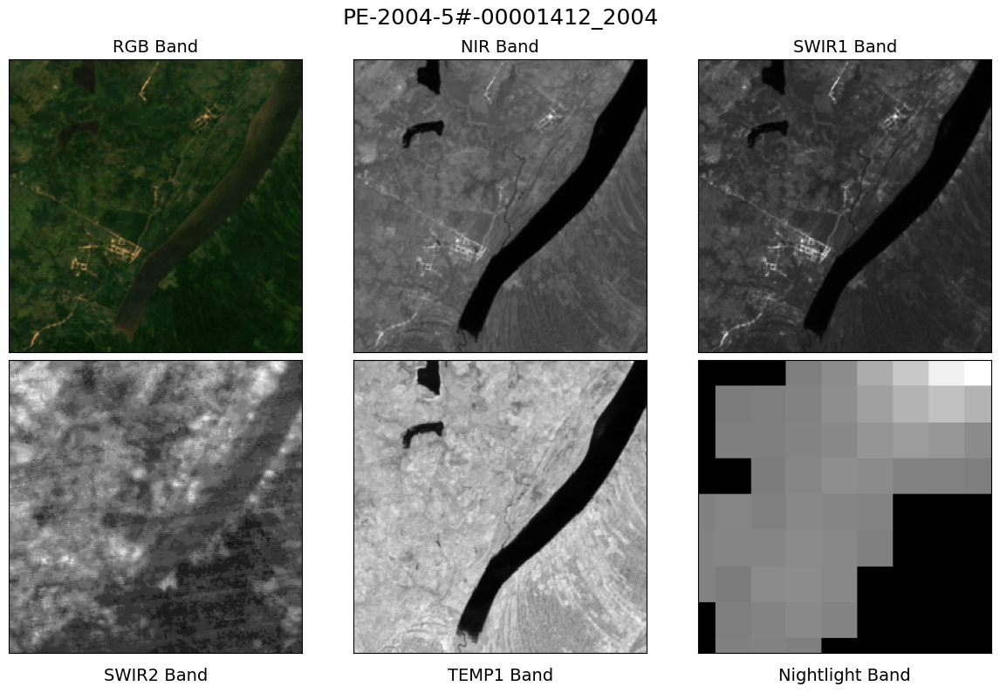

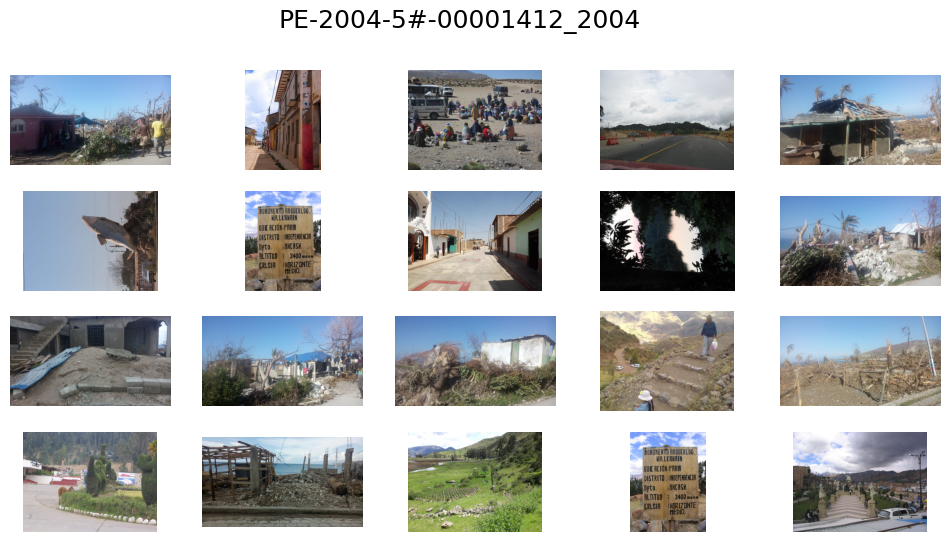

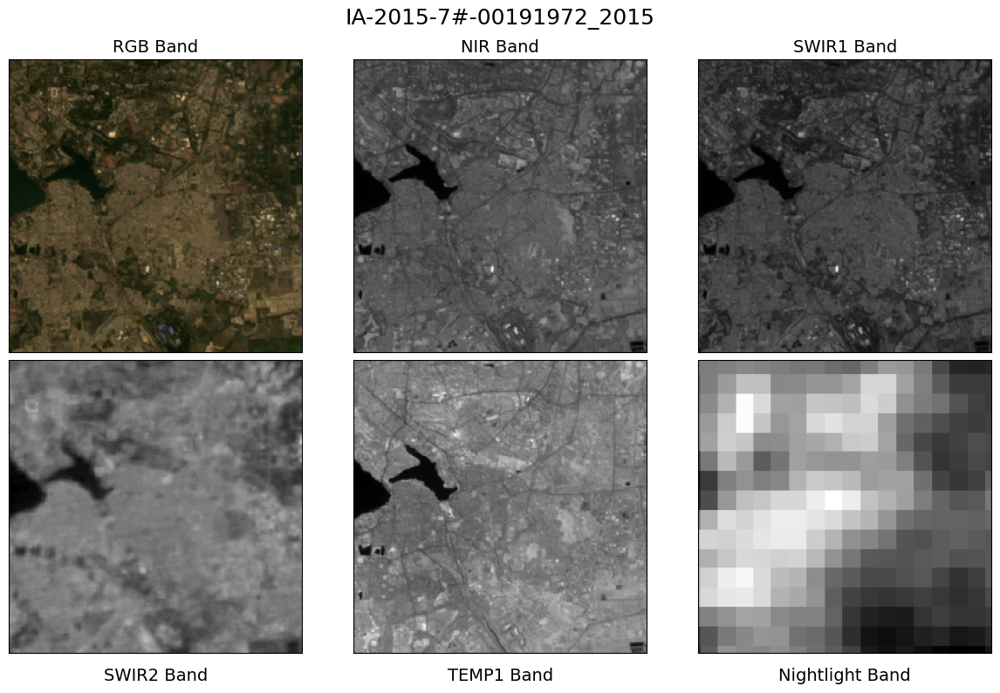

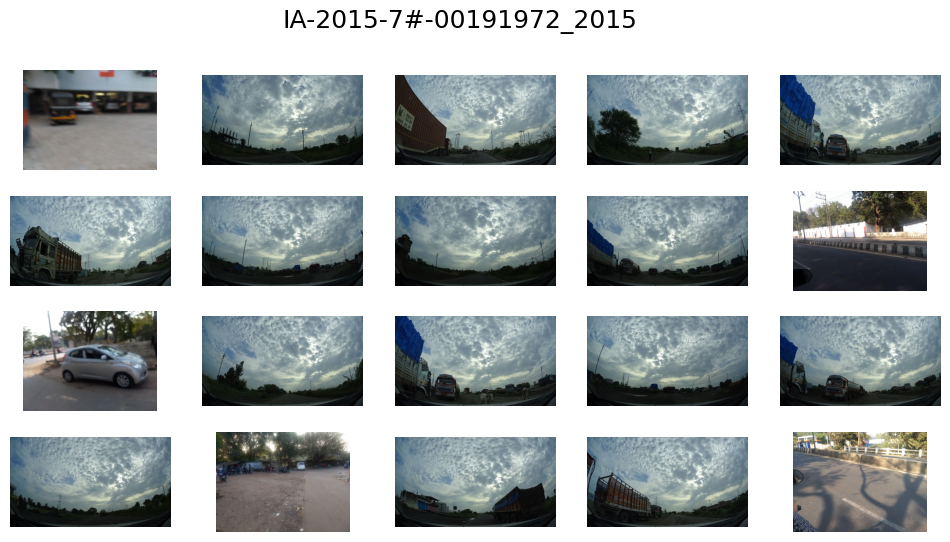

In [3]:
### plotting satelite images
import torch
def plot_satelite_image(img: np.array, save_dir="", title=""):    
    if img.shape[0] == 8:
        fig, ax = plt.subplots(2, 3, figsize=(12, 8))
        ax = ax.flatten()

        # No ticks
        for a in ax:
            a.set_xticks([])
            a.set_yticks([])

        # RGB Bands
        img_rgb = img[:3].transpose(1, 2, 0)  # Select the first three bands for RGB
        img_rgb = img_rgb[..., ::-1]  # BGR to RGB
        img_rgb_normalized = (img_rgb - img_rgb.min()) / (img_rgb.max() - img_rgb.min())

        ax[0].imshow(img_rgb_normalized)
        ax[0].set_title('RGB Band', fontsize=14)

        # NIR Band
        ax[1].imshow(img[3], cmap='gray')
        ax[1].set_title('NIR Band', fontsize=14)

        # SWIR1 Band
        ax[2].imshow(img[4], cmap='gray')
        ax[2].set_title('SWIR1 Band', fontsize=14)

        # SWIR2 Band
        ax[3].imshow(img[5], cmap='gray')
        ax[3].text(0.5, -0.05, 'SWIR2 Band', transform=ax[3].transAxes, ha='center', va='top', fontsize=14)

        # TEMP1 Band
        ax[4].imshow(img[6], cmap='gray')
        ax[4].text(0.5, -0.05, 'TEMP1 Band', transform=ax[4].transAxes, ha='center', va='top', fontsize=14)

        # Nightlight Band
        ax[5].imshow(img[7], cmap='gray')
        ax[5].text(0.5, -0.05, 'Nightlight Band', transform=ax[5].transAxes, ha='center', va='top', fontsize=14)
    elif img.shape[0] == 3:
        fig, ax = plt.subplots(1, 1, figsize=(6, 6))
        ax.imshow(img.transpose(1, 2, 0))
        ax.set_xticks([])
        ax.set_yticks([])
    else:
        raise ValueError("Image shape not supported: ", img.shape)
        
    fig.suptitle(f'{title}', fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 1])
    plt.show()
    if save_dir != "":
        fig.savefig(f'{save_dir}/{title}_satelite_image.png')
    plt.close(fig)

# Plotting street images
def plot_street_images(images, save_dir="", title=""):
    # # get the closest 20 images
    fig, axes = plt.subplots(4,5, figsize=(12, 6))
    fig.suptitle(f'{title}', fontsize=18)
        
    for i, ax in enumerate(axes.flatten()):
        try:
            ax.axis("off")
            ax.imshow(images[i].transpose(1, 2, 0))
        except Exception as e:
            pass
            # print(f"Error plotting image {i}, {e}")
    plt.tight_layout
    plt.show()
    if save_dir != "":
        fig.savefig(f'{save_dir}/{title}_closest_images')
    plt.close(fig)

# Randomly draw from df an image and its metadata

save_dir = "C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/data_exploration"
# mkdir if not exist yet
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

    
# random_dhsid = random.choice(df.index)
# the first entry
# random between 0 and 2000

np.random.seed(0)
for i in range(2):
    random_dhsid = np.random.choice(df.index)

    random_dh = df.loc[random_dhsid]
    dhsid_ea, npz_path, year = random_dh.name , random_dh['path'], random_dh['year']
    satelite_img = np.load(npz_path)['x']  # shape (C, H, W) -> (8, 256, 256)
    
    plot_satelite_image(satelite_img, save_dir, title=f'{dhsid_ea}_{year}')

    # get closest from entries from metadata dataframe based on the entry's img_lat, img_long
    metadata = metadata_all.copy()
    # directly take k-nearest images don't really work cuz they just end up looking the same eg. view of a road
    # metadata['distance'] = np.sqrt((metadata['img_lat'] - random_dh['lat'])**2 + (metadata['img_lon'] - random_dh['lon'])**2)
    # metadata.sort_values('distance', inplace=True)
    # metadata.drop(columns='distance', inplace=True)
    # metadata.head()
    # sort then sample randomly with more weight on the closer images
    metadata['distance'] = np.sqrt((metadata['img_lat'] - random_dh['lat'])**2 + (metadata['img_lon'] - random_dh['lon'])**2)
    metadata.sort_values('distance', inplace=True)
    # Distance in long/lat units is ~110km per degree

    # Cutoff by number 
    # only keep nearest 500
    metadata = metadata.iloc[:1000]

    # Cutoff by distance
    # Technically the entire landsat image is ~1 degree (right?) which is 110km
    # Then the distance from the center is 0.5 deg -> 55km 
    # only keep images within 0.1 degree
    # metadata = metadata[metadata['distance'] < 0.1]
    # But experimentally this doens't work well - sometimes there just isn't enough images in an arbitrary 0.1 degree radius
    
    # I feel like even the cluster isn't at the precise center of the image anyways it's not that important to weight it 
    # We want to see more of the surrounding area (probably) 
    weighted_dist = False
    if weighted_dist: 
        metadata['weight'] = 1 / metadata['distance']
        metadata['weight'] = metadata['weight'] / metadata['weight'].sum()
        metadata = metadata.sample(20, weights=metadata['weight'], replace=False)
        metadata.drop(columns=['distance', 'weight'], inplace=True)
    else:
        metadata = metadata.sample(20, replace=False)
        metadata.drop(columns='distance', inplace=True)
    
    # turn this into a batch of images
    metadata['path'] = metadata['img_path'].apply(lambda x: street_level_image_folder + "/" + x) 
    metadata['img'] = metadata['path'].apply(lambda x: plt.imread(x))
    # metadata['img'] = metadata['img'].apply(lambda x: x[:256, :256, :])  # crop to 256x256
    metadata['img'] = metadata['img'].apply(lambda x: x.astype(np.float32))
    metadata['img'] = metadata['img'].apply(lambda x: x / 255)  # normalize
    metadata['img'] = metadata['img'].apply(lambda x: x.transpose(2, 0, 1))  # shape (H, W, C) -> (C, H, W)
    images = metadata['img'].values
    
    plot_street_images(images, save_dir, title=f'{dhsid_ea}_{year}')


=========== asset_index     ============
k= 1, asset_index     r^2 = 0.266
k= 2, asset_index     r^2 = 0.322
k= 3, asset_index     r^2 = 0.364
k= 4, asset_index     r^2 = 0.395
k= 5, asset_index     r^2 = 0.386
k= 6, asset_index     r^2 = 0.382
k= 7, asset_index     r^2 = 0.382
k= 8, asset_index     r^2 = 0.391
k= 9, asset_index     r^2 = 0.390
k=10, asset_index     r^2 = 0.395
k=11, asset_index     r^2 = 0.393
k=12, asset_index     r^2 = 0.399
k=13, asset_index     r^2 = 0.402
k=14, asset_index     r^2 = 0.397
k=15, asset_index     r^2 = 0.397
k=16, asset_index     r^2 = 0.400
k=17, asset_index     r^2 = 0.393
k=18, asset_index     r^2 = 0.390
k=19, asset_index     r^2 = 0.387
k=20, asset_index     r^2 = 0.383
FINAL: k=13, asset_index     r^2 = 0.43
=========== under5_mort     ============
k= 1, under5_mort     r^2 = 0.000
k= 2, under5_mort     r^2 = 0.000
k= 3, under5_mort     r^2 = 0.000
k= 4, under5_mort     r^2 = 0.000
k= 5, under5_mort     r^2 = 0.000
k= 6, under5_mort     r^2 = 

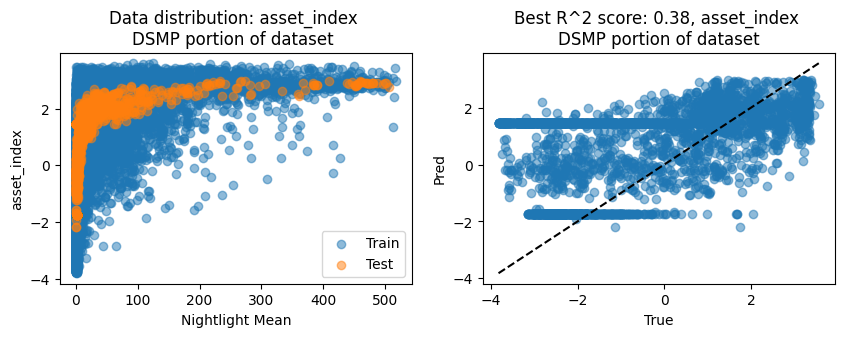

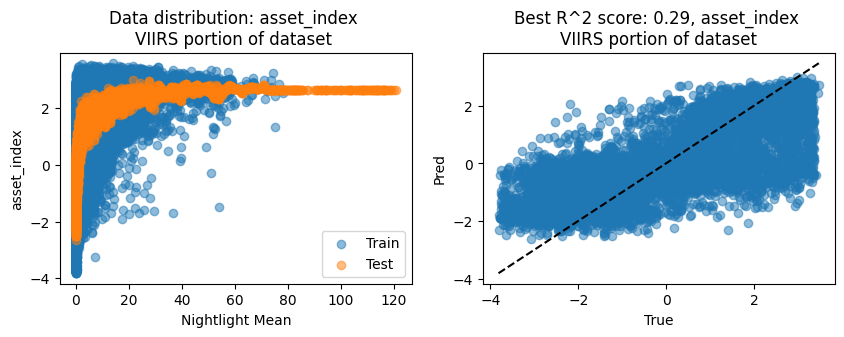

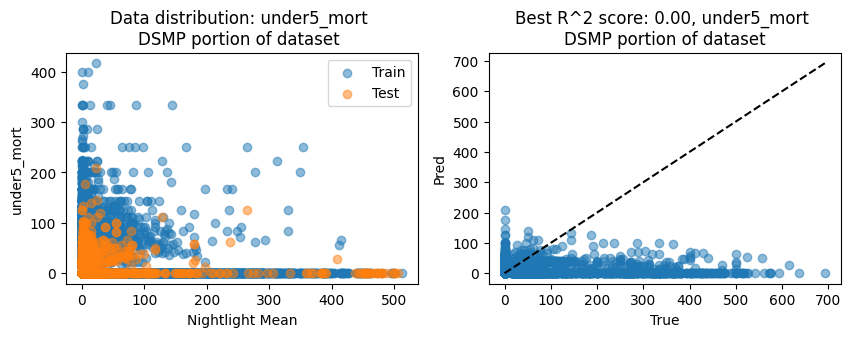

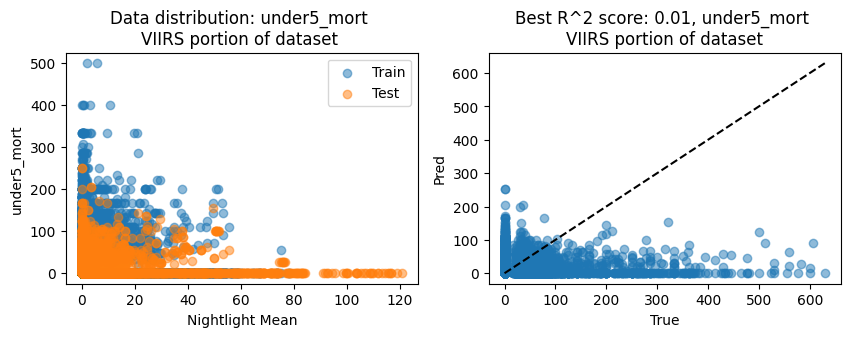

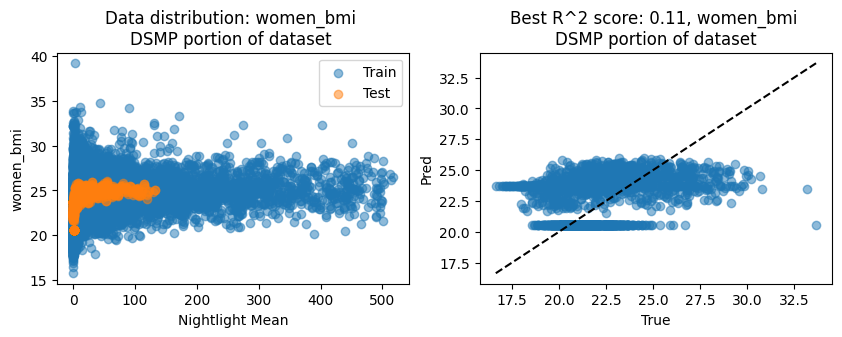

...

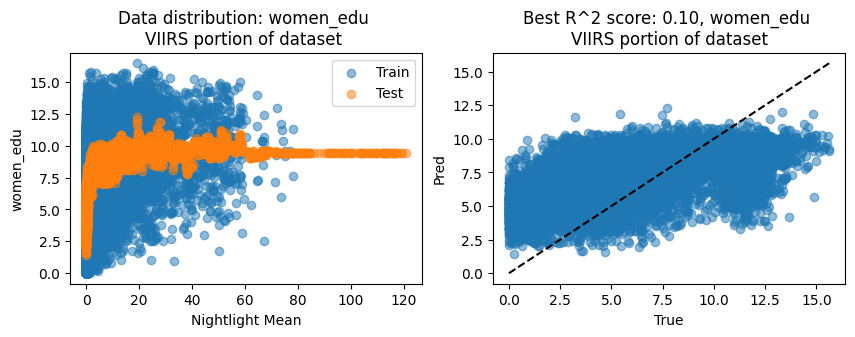

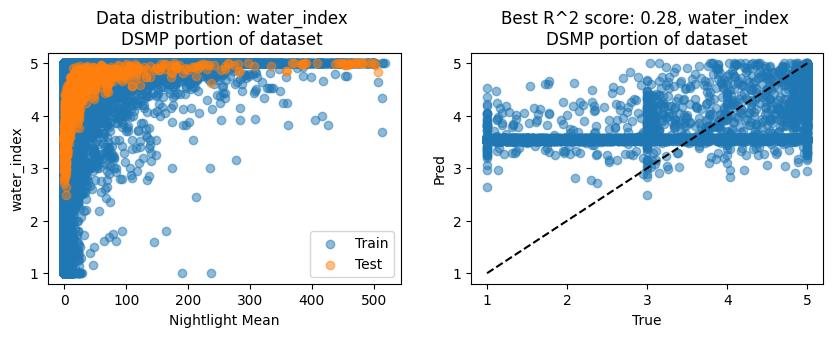

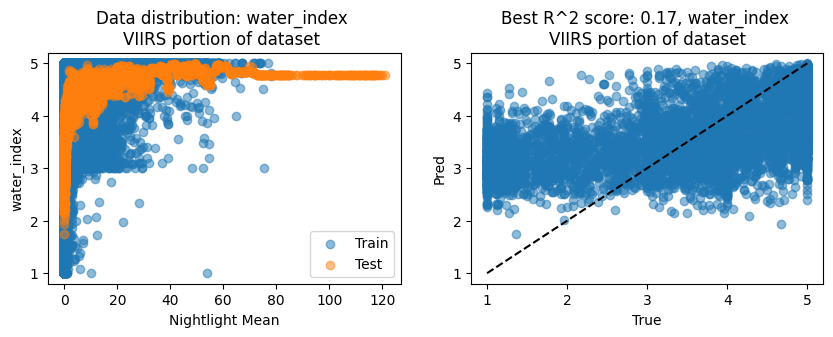

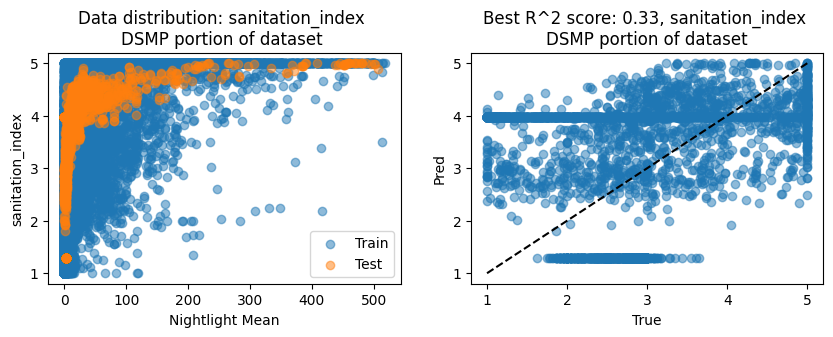

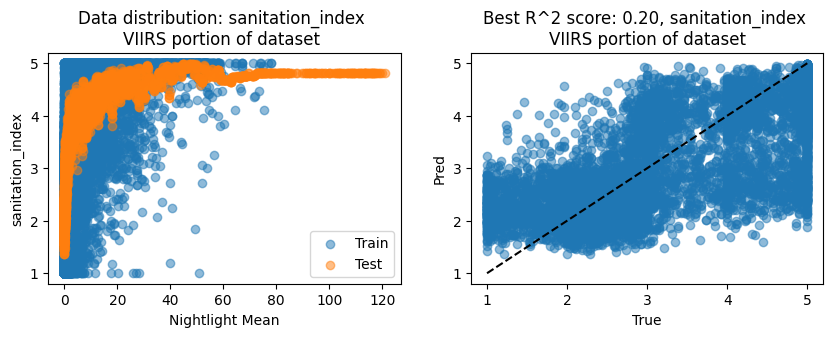

In [4]:
# Recreating baselines results
# Code taken from knn_baseline.ipynb provided by sustainbench
import scipy.stats
import sklearn.neighbors
import warnings
warnings.filterwarnings('ignore')
# close all fig
plt.close('all')


results_df = pd.DataFrame(
    data=np.nan,
    columns=['nl_mean', 'year'],
    index=df.index #pd.Index(sorted(df['DHSID_EA']), name='DHSID_EA')
)
# results_df.head()

def calculate_nl_mean(path_and_year) -> tuple[np.ndarray, np.ndarray, int]:
    '''
    Args
    - path_year: tuple (path, year)
      - path: str, path to npz file containing single entry 'x'
        representing a (C, H, W) image
      - year: int

    Returns: (nl_mean, year)
    '''
    dhsid_ea, npz_path, year = path_and_year
    img = np.load(npz_path)['x']  # shape (C, H, W)
    nl_mean = img[-1].mean(dtype=np.float64)
    return dhsid_ea, nl_mean, year

# If not already calculated, calculate the mean nightlight values for each DHSID_EA
# It takes ~10 minutes
if not os.path.exists('mean_nl.csv'):
    with ThreadPoolExecutor(max_workers=30) as pool:
        inputs = path_years
        futures = pool.map(calculate_nl_mean, inputs)
        for dhsid_ea, nl_mean, year in tqdm(futures, total=len(inputs)):
            results_df.loc[dhsid_ea, ['nl_mean', 'year']] = (nl_mean, year)
    results_df.to_csv('mean_nl.csv')
else:
    results_df = pd.read_csv('mean_nl.csv', index_col=0)
    
results_df['year'] = results_df['year'].astype(int)


SPLITS = {
    'train': [
        'AL', 'BD', 'CD', 'CM', 'GH', 'GU', 'HN', 'IA', 'ID', 'JO', 'KE', 'KM',
        'LB', 'LS', 'MA', 'MB', 'MD', 'MM', 'MW', 'MZ', 'NG', 'NI', 'PE', 'PH',
        'SN', 'TG', 'TJ', 'UG', 'ZM', 'ZW'],
    'val': [
        'BF', 'BJ', 'BO', 'CO', 'DR', 'GA', 'GN', 'GY', 'HT', 'NM', 'SL', 'TD',
        'TZ'],
    'test': [
        'AM', 'AO', 'BU', 'CI', 'EG', 'ET', 'KH', 'KY', 'ML', 'NP', 'PK', 'RW',
        'SZ']
}
SPLITS['trainval'] = SPLITS['train'] + SPLITS['val']
label_cols = ['asset_index', 'under5_mort', 'women_bmi', 'women_edu', 'water_index', 'sanitation_index']

results_df['cc'] = results_df.index.str[:2]

# This part is modified to plot as well
def run(model, label, dmsp, trainsplit='train', testsplit='test', plot=False, additional_comments=""):
    if dmsp:
        year_mask = (df['year'] <= 2011)
    else:
        year_mask = (df['year'] > 2011)

    train_dhsids = df.index[year_mask & df['cc'].isin(SPLITS[trainsplit]) & df[label].notna()]
    test_dhsids = df.index[year_mask & df['cc'].isin(SPLITS[testsplit]) & df[label].notna()]

    train_X = results_df.loc[train_dhsids, 'nl_mean'].values.reshape(-1, 1)
    train_Y = df.loc[train_dhsids, label].values
    test_X = results_df.loc[test_dhsids, 'nl_mean'].values.reshape(-1, 1)
    test_Y = df.loc[test_dhsids, label].values

    model.fit(train_X, train_Y)
    preds = knn.predict(test_X)
    
    # plot predictions
    if plot:
        r2 = scipy.stats.pearsonr(
            np.concatenate([preds_dmsp, preds_viirs]),
            np.concatenate([labels_dmsp, labels_viirs])
        )[0]**2
                
        fig, ax = plt.subplots(1,2, figsize=(10, 3))
        ax = ax.flatten()
        # plot the knn results clustering, with the color representing the label
        ax[0].scatter(train_X, train_Y, alpha=0.5)
        ax[0].scatter(test_X, preds, alpha=0.5)
        ax[0].set_xlabel('Nightlight Mean')
        ax[0].set_ylabel(label)
        ax[0].set_title(f'Data distribution: {label} \n{additional_comments} ')
        ax[0].legend(['Train', 'Test'])
        
        # plot something that would show the r2 score
        ax[1].scatter(test_Y, preds, alpha=0.5)
        ax[1].plot(
            [test_Y.min(), test_Y.max()],
            [test_Y.min(), test_Y.max()], 
            'k--')
        ax[1].set_xlabel('True')
        ax[1].set_ylabel('Pred')
        ax[1].set_title(f'Best R^2 score: {r2:.02f}, {label} \n{additional_comments}')
        fig.show()     
        
    return preds, test_Y

# Uncomment to visualize knn
for label in label_cols:
    print(f'=========== {label:15s} ============')
    best_r2 = 0
    best_k = None
    for k in range(1, 21):
        knn = sklearn.neighbors.KNeighborsRegressor(
            n_neighbors=k, weights='uniform', algorithm='auto')
        preds_dmsp, labels_dmsp = run(knn, label, True, 'train', 'val')
        preds_viirs, labels_viirs = run(knn, label, False, 'train', 'val')
        r2 = scipy.stats.pearsonr(
            np.concatenate([preds_dmsp, preds_viirs]),
            np.concatenate([labels_dmsp, labels_viirs])
        )[0]**2
        print(f'k={k:2d}, {label:15s} r^2 = {r2:.3f}')
        if r2 > best_r2:
            best_r2 = r2
            best_k = k
    knn = sklearn.neighbors.KNeighborsRegressor(
            n_neighbors=best_k, weights='uniform', algorithm='auto')
    
    preds_dmsp, labels_dmsp = run(knn, label, True, 'trainval', 'test', plot=True, additional_comments="DSMP portion of dataset")
    preds_viirs, labels_viirs = run(knn, label, False, 'trainval', 'test', plot=True, additional_comments="VIIRS portion of dataset")
    r2 = scipy.stats.pearsonr(
        np.concatenate([preds_dmsp, preds_viirs]),
        np.concatenate([labels_dmsp, labels_viirs])
    )[0]**2
    print(f'FINAL: k={best_k:2d}, {label:15s} r^2 = {r2:.2f}')  
    


In [5]:
# from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
# from sklearn.preprocessing import StandardScaler
# from sklearn.pipeline import Pipeline
# from sklearn.svm import SVR
# import numpy as np
# import scipy.stats
# import tqdm

# # Define parameter distributions for RandomizedSearchCV
# param_distributions = {
#     'svr__C': scipy.stats.loguniform(1e-3, 1e3),
#     'svr__epsilon': scipy.stats.loguniform(1e-4, 1e1),
#     'svr__gamma': ['scale', 'auto']
# }

# # Create a pipeline with scaling and SVR
# pipeline = Pipeline([
#     ('scaler', StandardScaler()),
#     ('svr', SVR(kernel='rbf'))
# ])

# # Perform Randomized Search
# random_search = RandomizedSearchCV(
#     pipeline, param_distributions, n_iter=20, cv=3, verbose=1, n_jobs=-1, random_state=42
# )
# label = label_cols[0]  # asset index only
# dmsp = False
# if dmsp:
#     year_mask = (df['year'] <= 2011)
# else:
#     year_mask = (df['year'] > 2011)

# train_dhsids = df.index[year_mask & df['cc'].isin(SPLITS['train']) & df[label].notna()]
# test_dhsids = df.index[year_mask & df['cc'].isin(SPLITS['train']) & df[label].notna()]

# train_X = results_df.loc[train_dhsids, 'nl_mean'].values.reshape(-1, 1)
# train_Y = df.loc[train_dhsids, label].values
# test_X = results_df.loc[test_dhsids, 'nl_mean'].values.reshape(-1, 1)
# test_Y = df.loc[test_dhsids, label].values
# # Fit the model
# random_search.fit(train_X, train_Y)

# # Get the best parameters
# best_params = random_search.best_params_
# print(f"Best parameters: {best_params}")

# # Evaluate on validation set
# preds_viirs, labels_viirs = run(random_search.best_estimator_, label, False, 'train', 'val')
# r2 = scipy.stats.pearsonr(
#     np.concatenate([preds_dmsp, preds_viirs]),
#     np.concatenate([labels_dmsp, labels_viirs])
# )[0]**2
# print(f'Best R2: {r2:.3f}')

# # Final evaluation on test set
# preds_viirs, labels_viirs = run(random_search.best_estimator_, label, False, 'trainval', 'test', plot=True, additional_comments="VIIRS portion of dataset")
# r2 = scipy.stats.pearsonr(
#     np.concatenate([preds_dmsp, preds_viirs]),
#     np.concatenate([labels_dmsp, labels_viirs])
# )[0]**2
# print(f'Final R2: {r2:.3f}')


In [6]:
# For the same sanitation index, cluster the nightlight means for different countries 



# Train gaussian model conditioned on priors of the country


<span style='color:red'> **[Your insights go here. To be completed by you]** </span>

### 3. Task and evaluation (10%)

**Guidelines**: Tell us a bit about the main task that in your view this dataset could help solve and propose and justify the evaluation criteria that would be important here, not only considering the task but your exploratory data analysis. For example, if you found that there is class imbalance in the dataset and that the most important class is the minority one, you may want to add costs in your evaluation metric to account for it, or maybe you want to use a metric specifically suited for imbalanced classification.

<span style="color:red; font-weight:bold;">
Gdoc 2
</span>


### 4. Design and build an ML system (20%)

**Guidelines**: Taking into account the task and evaluation criteria set in the previous section design and build now an ML system. If you go for supervised learning, you could start by partiting your dataset in train and test here and try a model on the dataset. But please justify your choices in each case. Why did you choose a specific ML model? Why is it relevant for the task and dataset at hand? Do you envision any challenges with the use of such model? 

Again, we do not ask for a specific model to be used. Instead, we will evaluate the depth and appropriatedness of your analysis. As this section (and some of the following ones) are more open ended we do not specify marks for each question.


***
Please note that if the dataset of your choice is too large to work with, you can simply choose a subset of it. We will not substract any marks for doing so. 
***


In [7]:
import sys; sys.path.append('C:/UCL Coursework/Sem 1/COMP0173/sustainbench')
import pickle
from pprint import pprint

os.environ['CUDA_VISIBLE_DEVICES'] = ''

FOLDS = ['A', 'B', 'C', 'D', 'E']
SPLITS = ['train', 'val', 'test']
BAND_ORDER = ['BLUE', 'GREEN', 'RED', 'SWIR1', 'SWIR2', 'TEMP1', 'NIR', 'NIGHTLIGHTS']
DATASET = '2009-17'

from sustainbench.datasets.dataset_constants import *
COUNTRIES = np.asarray(DHS_COUNTRIES)

from sustainbench.common.geo_plot import setup_ax
from sustainbench.common.create_folds import create_folds, verify_folds

locs = df[['lat', 'lon']].values
# add col for country name from abbreviation using COUNTRY_NAMES_MAP dict
df['country'] = df['cname'].map(COUNTRY_NAMES_MAP)

def create_incountry_folds(locs, folds_path):
    '''
    Args
    - locs: np.array, shape [N, 2], each row is [lat, lon]
    - folds_path: str, path to save incountry folds dict
    '''
    MIN_DIST = 0.092841  # sqrt(0.060570**2 + 0.070361**2)
    DIST_METRIC = 'euclidean'
    MAX_INDEX = len(df)

    locs_to_indices, test_folds = create_folds(
        locs, min_dist=MIN_DIST, dist_metric=DIST_METRIC, fold_names=FOLDS,
        plot_largest_clusters=5)
    verify_folds(test_folds, locs=locs, min_dist=MIN_DIST,
                 dist_metric=DIST_METRIC, max_index=MAX_INDEX)

    print('Size of each fold')
    pprint({f: len(indices) for f, indices in test_folds.items()})

    # create train/val/test splits
    folds = {}
    for i, f in enumerate(FOLDS):
        folds[f] = {}
        folds[f]['test'] = test_folds[f]

        val_f = FOLDS[(i+1) % 5]
        folds[f]['val'] = test_folds[val_f]

        train_fs = [FOLDS[(i+2) % 5], FOLDS[(i+3) % 5], FOLDS[(i+4) % 5]]
        folds[f]['train'] = np.sort(np.concatenate([test_folds[f] for f in train_fs]))

    if os.path.exists(folds_path):
        with open(folds_path, 'rb') as f:
            existing_folds = pickle.load(f)
        for f in FOLDS:
            for s in SPLITS:
                assert np.array_equal(folds[f][s], existing_folds[f][s])
    else:
        with open(folds_path, 'wb') as f:
            pickle.dump(folds, f)

In [8]:
def plot_splits(locs_dict, title=None, save_dir=None):
    '''
    Args
    - locs_dict: dict, label (str) => np.array of lat, lon
    '''
    fig = plt.figure(figsize=[30, 12], dpi=200)
    ax = setup_ax(fig)
    # no margin

    for label, locs_array in locs_dict.items():
        ax.scatter(locs_array[:, 1], locs_array[:, 0], label=label, linewidths=0.5, s=2, alpha=0.2)

    lgd = ax.legend(fontsize=16, title='Fold',title_fontsize=20)

    if title is not None:
        ax.set_title(title)
    plt.show()
    if save_dir is not None:
        fig.savefig(f'{save_dir}/{title}.png')

num clusters: 6677
max cluster size: 2499
num outliers: 9906


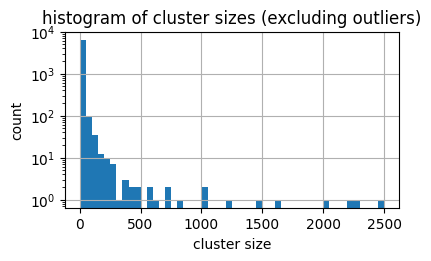

A B 0.09291565476280025
A C 0.09288239858768427
A D 0.09285345448945886
A E 0.09284992734358641
B C 0.09284121213018878
B D 0.0931023955116088
B E 0.09288222106800319
C D 0.0929657348938329
C E 0.09285587293703926
D E 0.09287827501089646
Size of each fold
{'A': 17388, 'B': 17387, 'C': 17387, 'D': 17387, 'E': 17387}


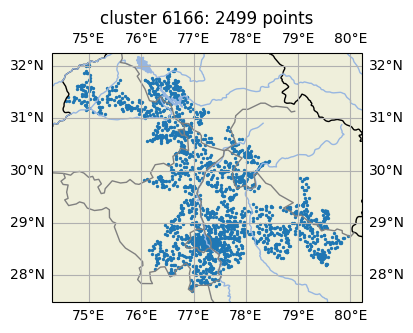

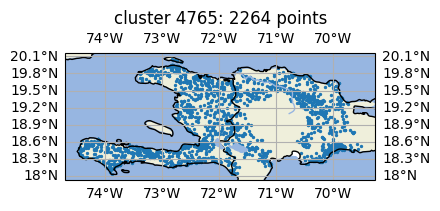

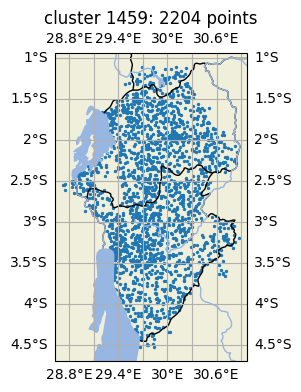

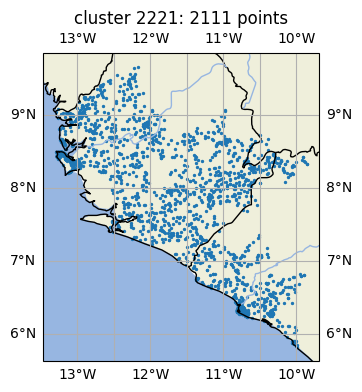

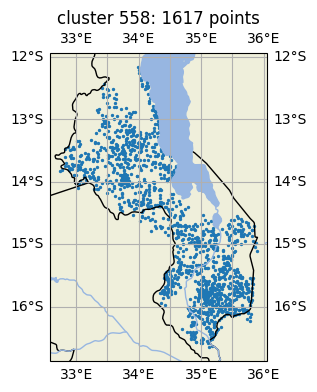

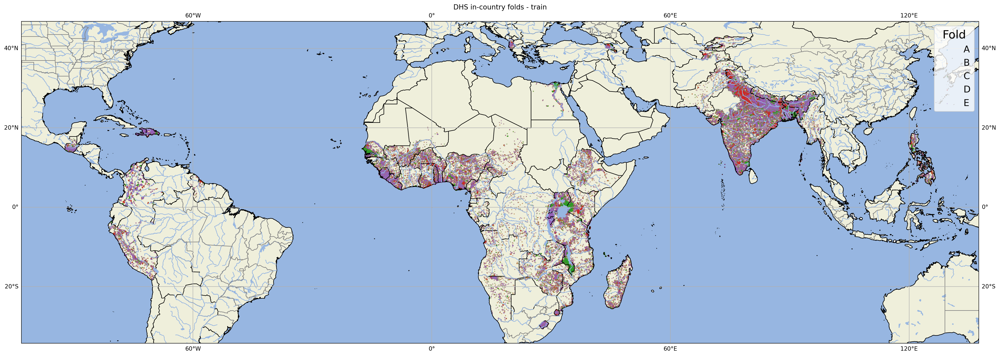

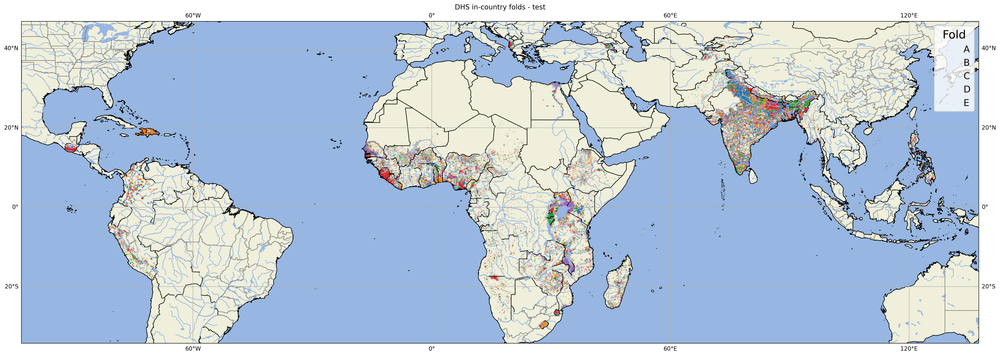

In [9]:
incountry_folds_path = 'C:/UCL Coursework/Sem 1/COMP0173/sustainbench/dataset/poverty/dhs_incountry_folds.pkl'

create_incountry_folds(locs, incountry_folds_path)
with open(incountry_folds_path, 'rb') as f:
    incountry_folds = pickle.load(f)

plot_splits({f: locs[incountry_folds[f]['train']] for f in FOLDS},
            title='DHS in-country folds - train', save_dir="./experiment_results/data_exploration")
plot_splits({f: locs[incountry_folds[f]['test']] for f in FOLDS},
            title='DHS in-country folds - test', save_dir="./experiment_results/data_exploration")

In [10]:
from collections import defaultdict
def plot_counts(folds, countries, country_indices):
    '''
    Args
    - folds: dict, folds[f][split] is a np.array of indices
    - countries: list of str, names of countries
    - country_indices: dict, country (str) => np.array of indices
    '''
    counts = np.zeros([len(countries), len(FOLDS)], dtype=np.float32)
    for i, country in enumerate(countries):
        idxs = country_indices[country]
        for j, f in enumerate(FOLDS):
            counts[i, j] = len(np.intersect1d(folds[f]['test'], idxs))
    counts /= np.sum(counts, axis=1, keepdims=True)
    folds_df = pd.DataFrame(data=counts, columns=FOLDS, index=countries)

    fig, ax = plt.subplots(1, 1, figsize=(8, 5))
    folds_df.plot.barh(ax=ax, stacked=True, width=0.8)
    ax.set_xlabel('fraction')
    fig.tight_layout()
    

# incountry_folds['A']['train'] # gives indexes of the training set for fold A for examplq
# write plotting function similar to above for this df


def plot_counts(folds, df):
    '''
    Args
    - folds: dict, folds[f][split] is a np.array of indices
    - df: pd.DataFrame, index is DHSID_EA
    '''
    # make copy of df and renumber indxs to be 0, 1, 2, ...
    df = df.copy()
    df.reset_index(inplace=True)
    counts = np.zeros([len(df['country'].unique()), len(FOLDS)], dtype=np.float32)
    for i, country in enumerate(df['country'].unique()):
        idxs = df[df['country'] == country].index
        
        for j, f in enumerate(FOLDS):
            counts[i, j] = len(np.intersect1d(folds[f]['test'], idxs))
    counts /= np.sum(counts, axis=1, keepdims=True)
    folds_df = pd.DataFrame(data=counts, columns=FOLDS, index=df['country'].unique())

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    folds_df.plot.barh(ax=ax, stacked=True, width=0.8)
    ax.set_xlabel('fraction')
    fig.tight_layout()

# plot_counts(incountry_folds, df)

In [11]:
def plot_countries_by_size(df):
    counts = df.groupby('country').size()
    counts.sort_values(inplace=True, ascending=False)

    fig, ax = plt.subplots(1, 1, figsize=(12, 4))
    counts.to_frame().plot(kind='bar', ax=ax, legend=None)
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right',
            rotation_mode='anchor')
    ax.set_ylabel('count')
    ax.set_title('Count by country')
    ax.grid(True, axis='y')
    fig.tight_layout()
    plt.show()

# plot_countries_by_size(df)

Image 0: Min=0.0003265879349783063, Max=0.8275402188301086, Shape=torch.Size([3, 224, 224])
Label: 0.545131266117096


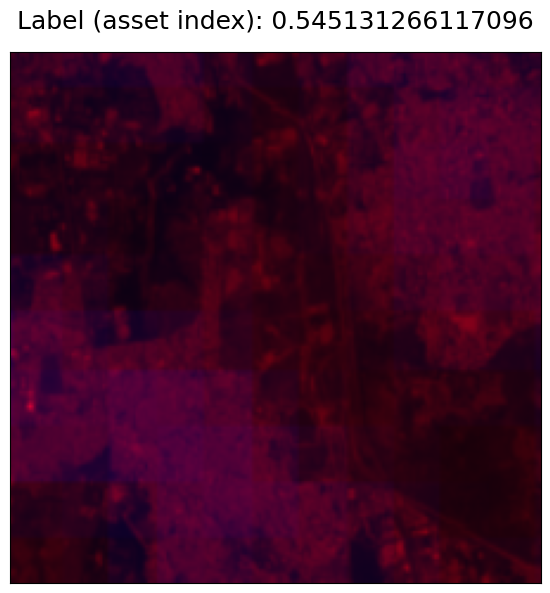

Image 1: Min=0.0, Max=0.583422064781189, Shape=torch.Size([3, 224, 224])
Label: -0.46041786670684814


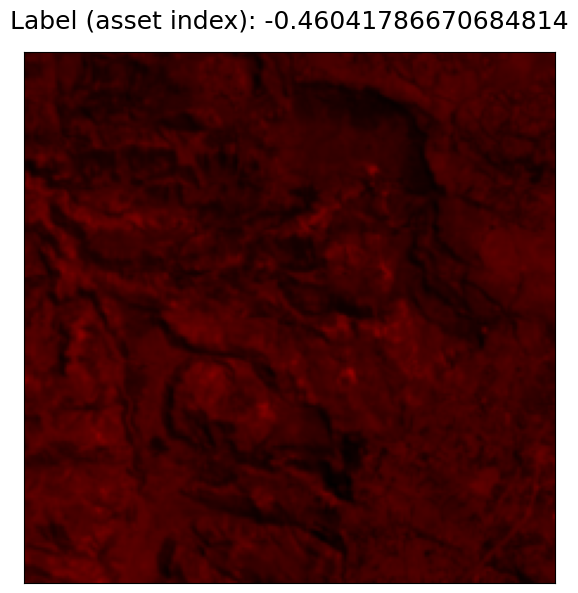

Image 2: Min=0.00034220103407278657, Max=0.7057092189788818, Shape=torch.Size([3, 224, 224])
Label: -0.27948108315467834


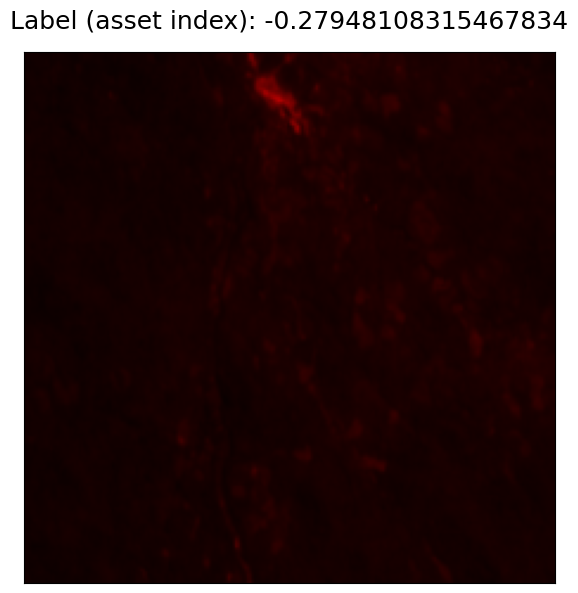

Image 3: Min=0.00031129835406318307, Max=0.5737190842628479, Shape=torch.Size([3, 224, 224])
Label: -0.4833875298500061


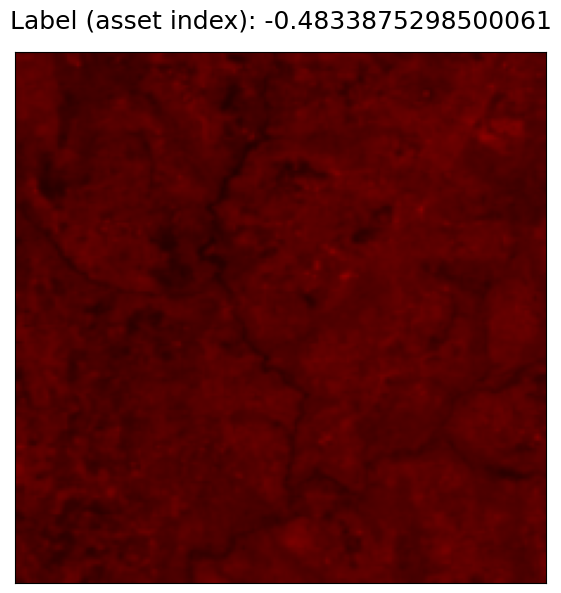

Image 0: Min=0.0005715947481803596, Max=0.2691637873649597, Shape=torch.Size([3, 224, 224])
Label: 0.4705089032649994


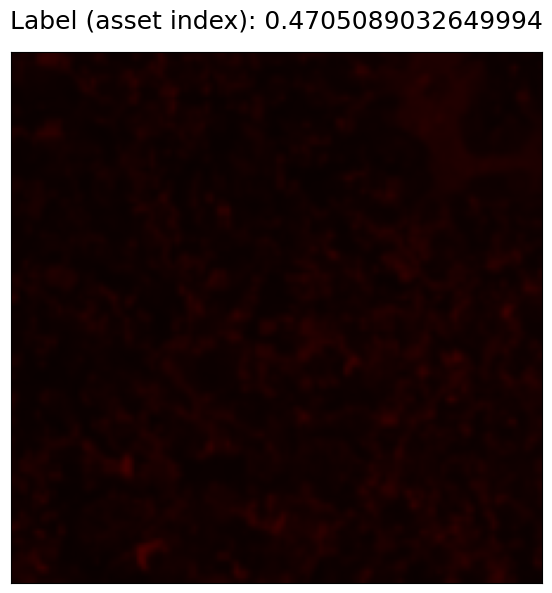

Image 1: Min=0.0, Max=0.5646547675132751, Shape=torch.Size([3, 224, 224])
Label: -0.24046780169010162


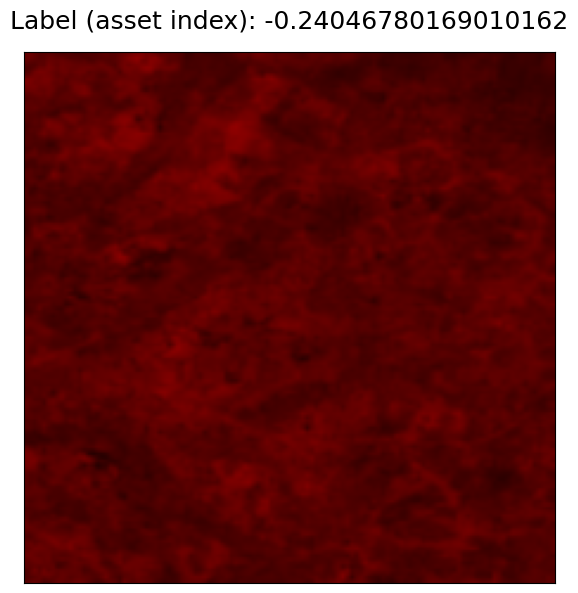

Image 2: Min=0.0002352941082790494, Max=0.5236569046974182, Shape=torch.Size([3, 224, 224])
Label: 0.30863404273986816


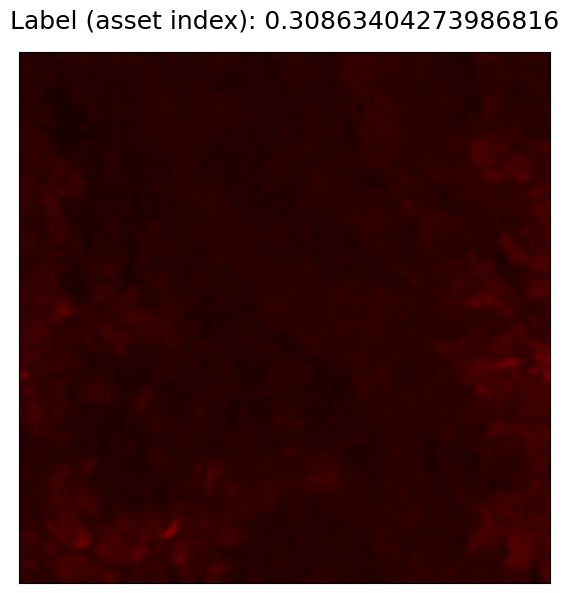

Image 3: Min=0.00023874943144619465, Max=0.5367084741592407, Shape=torch.Size([3, 224, 224])
Label: 0.021120838820934296


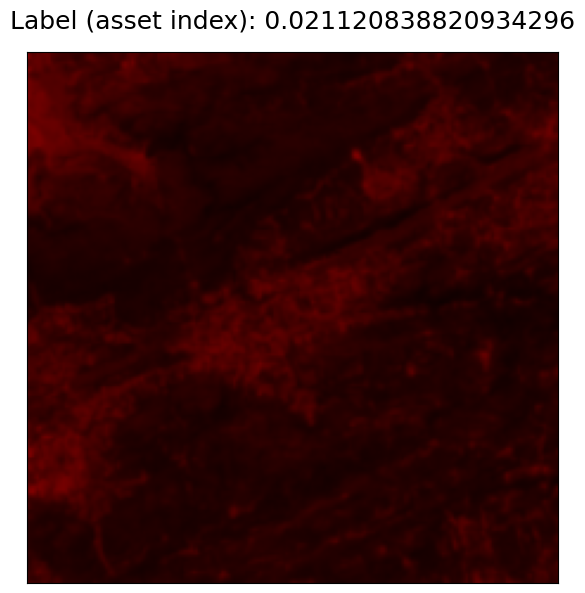

Image 0: Min=0.00015637229080311954, Max=0.642341136932373, Shape=torch.Size([3, 224, 224])
Label: 0.4572092294692993


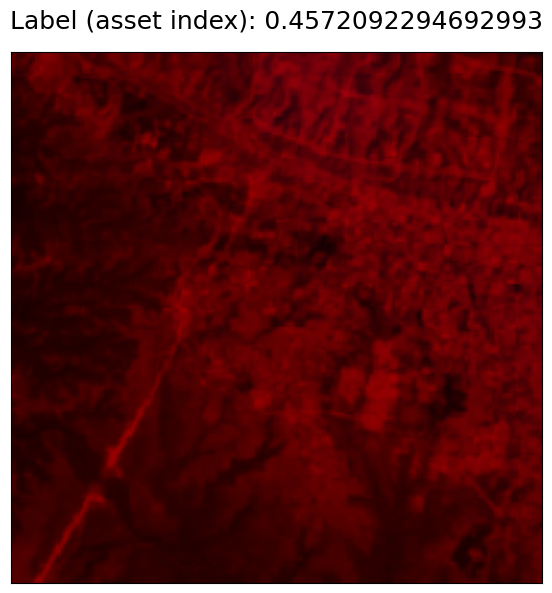

Image 1: Min=0.0005198848666623235, Max=0.707561731338501, Shape=torch.Size([3, 224, 224])
Label: 0.17063474655151367


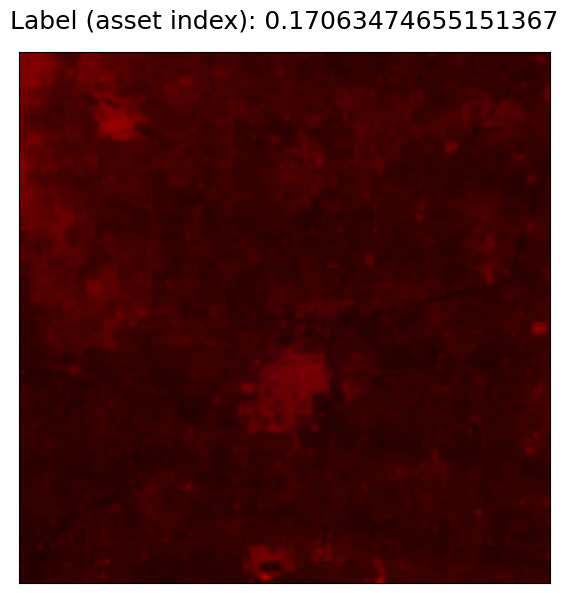

Image 2: Min=0.0007383987540379167, Max=0.6871036291122437, Shape=torch.Size([3, 224, 224])
Label: 0.4430082142353058


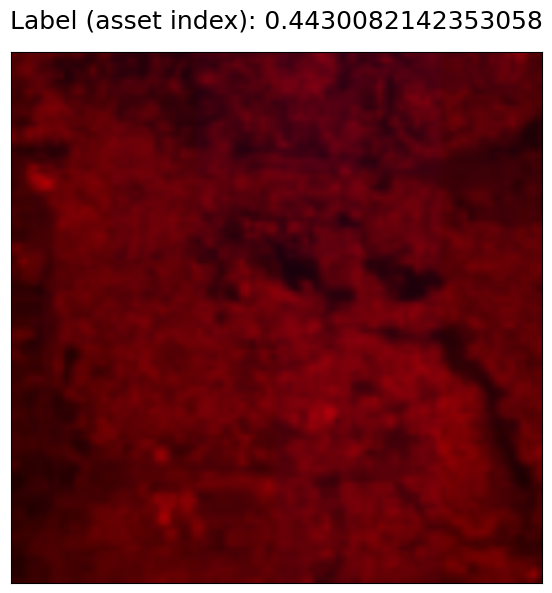

Image 3: Min=7.096113404259086e-05, Max=0.5565625429153442, Shape=torch.Size([3, 224, 224])
Label: 0.48547980189323425


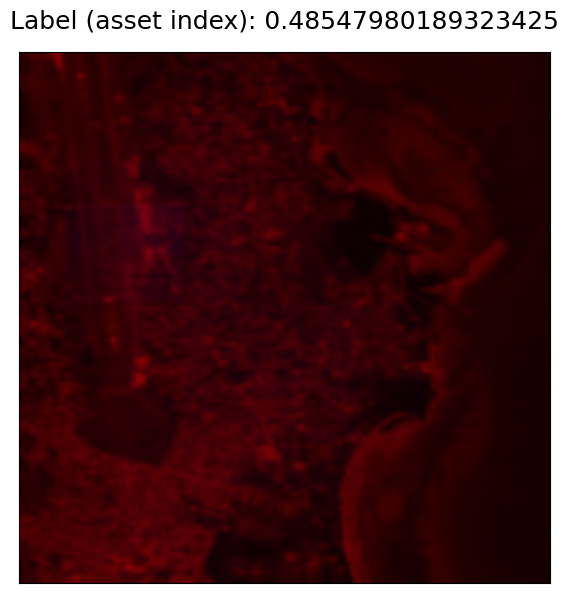

Image 0: Min=0.0005745375528931618, Max=0.7808368802070618, Shape=torch.Size([3, 224, 224])
Label: -0.27474701404571533


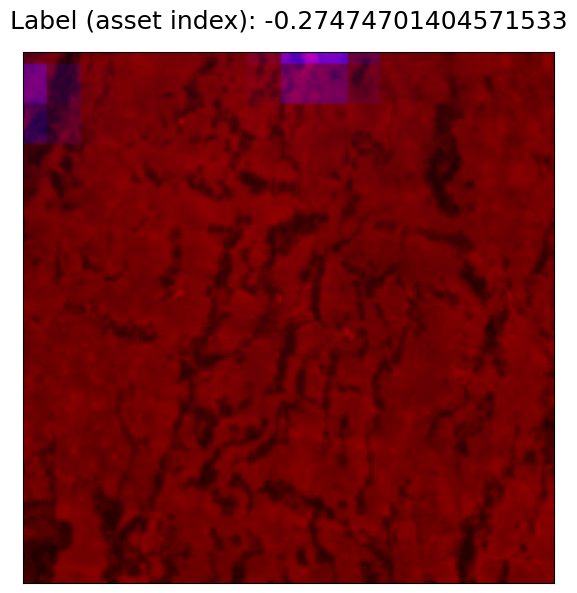

Image 1: Min=0.0006082236650399864, Max=0.6240188479423523, Shape=torch.Size([3, 224, 224])
Label: 0.17464585602283478


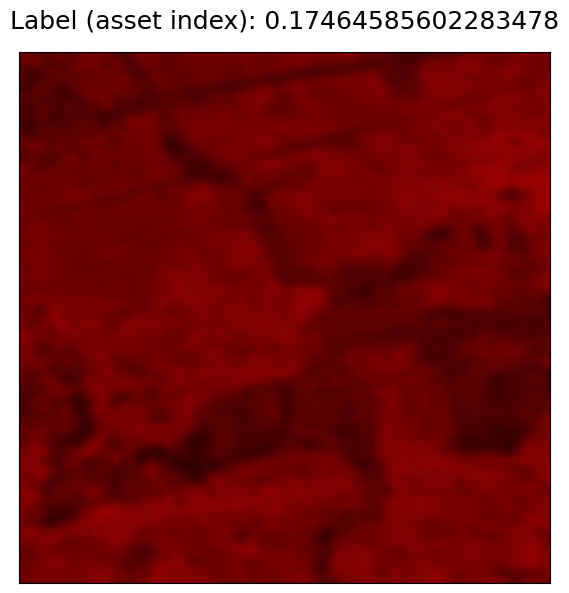

Image 2: Min=0.000181861367309466, Max=0.5074512958526611, Shape=torch.Size([3, 224, 224])
Label: 0.013369333930313587


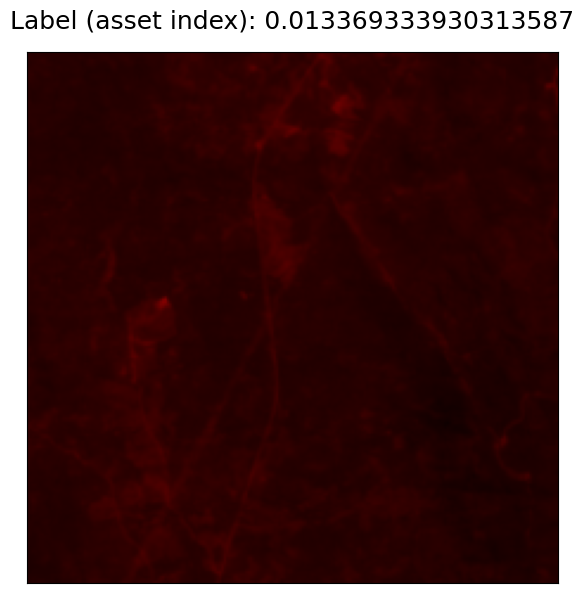

Image 3: Min=0.00019741387222893536, Max=0.72657710313797, Shape=torch.Size([3, 224, 224])
Label: -0.4391132593154907


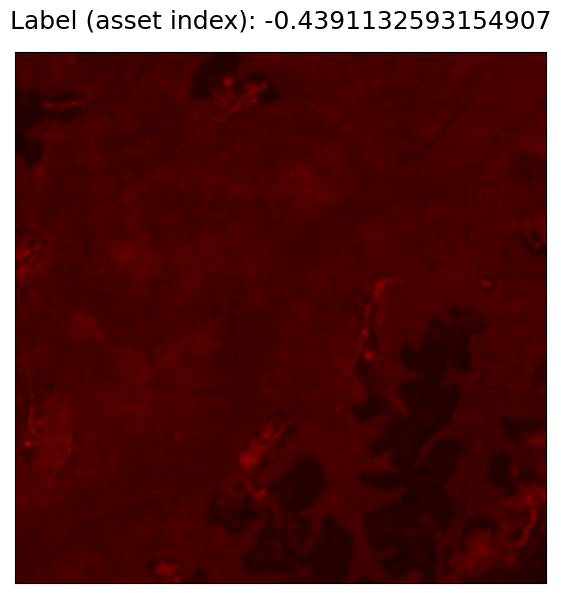

In [12]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import v2
import numpy as np
from pathlib import Path

class DHSIDDataset(Dataset):
    def __init__(self, df, folds, fold, split, transform=None, channels='RGB_NIR_NL'):
        self.df = df.iloc[folds[fold][split]].copy()
        # self.df['labels'] = self.df['asset_index']/5
        # self.df = self.df[~self.df['labels'].isna()]
        self.transform = transform
        self.channels = channels

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = np.load(row['path'])['x']  # Load image (C, H, W)
        img = torch.tensor(img, dtype=torch.float32)

        # Process RGB channels
        img_rgb = (img[0:3] - img[0:3].min()) / (img[0:3].max() - img[0:3].min())
        img_rgb = img_rgb.mean(dim=0, keepdim=True)  # Convert to grayscale

        # Normalize channels 6 and 7 (NIR, NL) from 0-255 to 0-1
        img_extra = img[[6, 7]] / 255.0
        img = torch.cat([img_rgb, img_extra], dim=0)

        label = torch.tensor(row['labels'], dtype=torch.float32)

        if self.transform:
            img = self.transform(img)

        return img, label

# Define transformations
transforms = v2.Compose([
    v2.RandomResizedCrop(size=(224, 224), antialias=True),
    v2.RandomHorizontalFlip(p=0.5),
    v2.ToDtype(torch.float32, scale=True),
])

# Instantiate dataset and dataloader
ds = DHSIDDataset(df, incountry_folds, 'A', 'train', transform=transforms)
dl = DataLoader(
    ds,
    batch_size=4,
    shuffle=True,
    # num_workers=4,  # Adjust based on the CPU core count
    # pin_memory=True,  # Speeds up GPU transfers
)

# Test DataLoader
for iterr, (img, label) in enumerate(dl):
    for i in range(len(img)):
        print(f"Image {i}: Min={img[i].min()}, Max={img[i].max()}, Shape={img[i].shape}")
        print(f"Label: {label[i].item()}")
        plot_satelite_image(
            img[i].numpy(),
            save_dir="C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/data_exploration",
            title=f"Label (asset index): {label[i].item()}",
        )
    if iterr > 2:
        break


In [13]:
# Get labels for metadata_all
# match metadata_all's lat, lon with df's lat, lon and use df's labels
metadata_all['labels'] = np.nan
for i, row in tqdm(metadata_all.iterrows(), total=len(metadata_all)):
    lat, lon = row['img_lat'], row['img_lon']
    dists = (df['lat'] - lat)**2 + (df['lon'] - lon)**2
    idx = dists.idxmin()
    metadata_all.loc[i, 'labels'] = df.loc[idx, 'labels']


  0%|          | 0/1682613 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
metadata_all['img_path_local'] = metadata_all['img_path'].apply(lambda x: street_level_image_folder + "/" + x)
# reinuemrate the indexes for metadata_all
metadata_all.reset_index(inplace=True)

In [18]:
# import Dataset from torch
from torch.utils.data import Dataset
# import dataloader
from torch.utils.data import DataLoader

import timm

model = timm.create_model(
    'mobilenetv4_conv_small_050.e3000_r224_in1k',
    pretrained=True,
    num_classes=0,  # remove classifier nn.Linear
)
model = model.eval()

# get model specific transforms (normalization, resize)
data_config = timm.data.resolve_model_data_config(model)
transforms = timm.data.create_transform(**data_config, is_training=False)


# Write a dataloader for the street level images
class StreetLevelDataset(Dataset):
    def __init__(self, metadata, transform=None):
        self.metadata = metadata
        self.transform = transform

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        try:
            row = self.metadata.iloc[idx]
            img = plt.imread(row['img_path_local'])
            img = img.astype(np.float32) / 255.0  # Normalize
            img = img.transpose(2, 0, 1)  # (H, W, C) -> (C, H, W)
            img = torch.tensor(img, dtype=torch.float32)

            if self.transform:
                img = self.transform(img)

            label = torch.tensor(row['labels'], dtype=torch.float32)

            idx = torch.tensor(idx, dtype=torch.int64)
            return idx, img, label

        except Exception as e:
            print(f"Error loading image {idx}: {e}")
            temp_filepath = "C:/UCL Coursework/Sem 1/COMP0173/sustainbench/dataset/poverty/mapillary/imagery/AL/AL-2008-5#-00000105/138149814963930.jpeg"
            row = self.metadata.iloc[idx]
            img = plt.imread(temp_filepath)
            img = img.astype(np.float32) / 255.0  # Normalize
            img = img.transpose(2, 0, 1)  # (H, W, C) -> (C, H, W)
            img = torch.tensor(img, dtype=torch.float32)

            if self.transform:
                img = self.transform(img)

            label = torch.tensor(row['labels'], dtype=torch.float32)

            idx = torch.tensor(idx, dtype=torch.int64)
            return idx, img, label
def calculate_embedding(model, dl):
    '''
    Args
    - model: nn.Module, pretrained model
    - dataloader: DataLoader, dataloader for the dataset
    '''
    embeddings = []
    idxs=[]
    with torch.no_grad():
        for idx, img, label in dl:
            embedding = model(img)
            embeddings.append(embedding)
            idxs.append(idx)
    embeddings = torch.cat(embeddings, dim=0)
    idxs = torch.cat(idxs, dim=0)
    return idxs, embeddings

In [20]:
# load from csv
metadata_all = pd.read_csv("C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/data_exploration/metadata_all_old.csv")

In [ ]:
len(metadata_all['DHSID_EA'].unique())

22052

In [ ]:
from torch_kmeans import KMeans

# for each DSID_EA in metadata_all, calculate image embeddings and the distance between the images
i = 0
# Get all the unique DSID_EA
unique_dhsid_ea = metadata_all['DHSID_EA'].unique()
metadata_all_copy = metadata_all.copy()  # Create a copy for iteration
DUPLICATES = []
for dhsid_ea in tqdm(unique_dhsid_ea):

# for i, dhsid_ea in enumerate(unique_dhsid_ea):
#     if i % 100 == 0:
#         print(f"Processing {i}/{len(unique_dhsid_ea)}: {dhsid_ea}")
    # Get all the images for this DSID_EA
    images = metadata_all_copy[metadata_all_copy['DHSID_EA'] == dhsid_ea]

    # load dataloader
    ds_street = StreetLevelDataset(images, transforms)
    dl_street = DataLoader(
        ds_street,
        batch_size=34,
        shuffle=False,
        # num_workers=4,  # Adjust based on the CPU core count
        # pin_memory=True,  # Speeds up GPU transfers
    )

    # Calculate the embeddings for each image
    idxs, embeddings = calculate_embedding(model, dl_street)

    # Calculate distance
    distance = torch.cdist(embeddings, embeddings, p=2)
    if distance.shape[0] == 1:
        continue

    # Set diagonals to nan
    distance_ = distance.clone()
    distance_[torch.eye(distance.shape[0], dtype=bool)] = np.nan
    
    # Plot a histogram of these distances
    # fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    # n, bins, patches = ax.hist(distance_.flatten(), bins=100)
    # ax.set_xlabel('Distance')
    # ax.set_ylabel('Count')
    # ax.set_title(f'Distance distribution for {dhsid_ea}')
    # # fig.show()
    # fig.savefig(f'C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/data_exploration/duplicates/{dhsid_ea}_distance_hist.png')
    # plt.close()
    threshold = 15
    duplicates = (distance_ < threshold).any(dim=0)
    # print(f'Number of duplicates: {duplicates.sum()}')
    DUPLICATES.append(duplicates.sum())
    # if sum(duplicates) > 0:
        # plot these duplicates
        # duplicates_idx = torch.where(duplicates)[0]
        # duplicates_images = images.iloc[duplicates_idx]
        # duplicates_images = duplicates_images['img_path_local'].apply(lambda x: plt.imread(x)).values

        # plotting
        # duplicates_images = [x.transpose(2, 0, 1) for x in duplicates_images]
        # save_dir = "C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/data_exploration/duplicates/"
        # plot_street_images(duplicates_images, save_dir, title=f'{dhsid_ea}_duplicates {duplicates.sum()} out of {len(images)}')
        # plt.close()
    # remove from metadata_all
    # get idxs of duplicates in the subset first
    duplicates_idx = torch.where(duplicates)[0]
    duplicates_images = images.iloc[duplicates_idx]
    # remove duplicate_images from metadata_all based on the index
    metadata_all_copy = metadata_all_copy[~metadata_all_copy['img_path'].isin(duplicates_images['img_path'])]
    # metadata_all_copy = metadata_all.copy()  # Update the copy for the next iteration

  0%|          | 0/22052 [00:00<?, ?it/s]

Error loading image 41: image file is truncated (5 bytes not processed)


In [ ]:
    
    # Set diagonals to nan
    distance_ = distance.clone()
    if distance_.shape[0] > 1:
        distance_[torch.eye(distance.shape[0], dtype=bool)] = np.nan
    

In [ ]:
distance.shape[0]

1

In [ ]:
distance_

tensor([[0.]])

In [ ]:
from torch_kmeans import KMeans

# for each DSID_EA in metadata_all, calculate image embeddings and the distance between the images
i = 0
# Get all the unique DSID_EA
unique_dhsid_ea = metadata_all['DHSID_EA'].unique()
for dhsid_ea in tqdm(unique_dhsid_ea):
    # Get all the images for this DSID_EA
    images = metadata_all[metadata_all['DHSID_EA'] == dhsid_ea]

    # load dataloader
    ds_street = StreetLevelDataset(images, transforms)
    dl_street = DataLoader(
        ds_street,
        batch_size=32,
        shuffle=False,
        # num_workers=4,  # Adjust based on the CPU core count
        # pin_memory=True,  # Speeds up GPU transfers
    )

    # Calculate the embeddings for each image
    idxs, embeddings = calculate_embedding(model, dl_street)

    # Calculate distance
    distance = torch.cdist(embeddings, embeddings, p=2)

    # exclude diagonals
    # distance_ = distance[~torch.eye(distance.shape[0], dtype=bool)].view(-1)
    
    # Set diagonals to nan
    distance_ = distance.clone()
    distance_[torch.eye(distance.shape[0], dtype=bool)] = np.nan
    
    
    # Plot a histogram of these distances
    fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    n, bins, patches = ax.hist(distance_.flatten(), bins=100)
    ax.set_xlabel('Distance')
    ax.set_ylabel('Count')
    ax.set_title(f'Distance distribution for {dhsid_ea}')
    # fig.show()
    fig.savefig(f'C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/data_exploration/duplicates/{dhsid_ea}_distance_hist.png')
    plt.close()
    threshold = 15
    duplicates = (distance_ < threshold).any(dim=0)
    print(f'Number of duplicates: {duplicates.sum()}')

    if sum(duplicates) > 0:
        # plot these duplicates
        duplicates_idx = torch.where(duplicates)[0]
        duplicates_images = images.iloc[duplicates_idx]
        duplicates_images = duplicates_images['img_path_local'].apply(lambda x: plt.imread(x)).values

        # transpose images back transpose(2, 0, 1)
        duplicates_images = [x.transpose(2, 0, 1) for x in duplicates_images]
        save_dir = "C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/data_exploration/duplicates/"
        plot_street_images(duplicates_images, save_dir, title=f'{dhsid_ea}_duplicates {duplicates.sum()} out of {len(images)}')
        plt.close()
    # remove from metadata_all
    # get idxs of duplicates in the subset first
    duplicates_idx = torch.where(duplicates)[0]
    duplicates_images = images.iloc[duplicates_idx]
    # remove duplicate_images from metadata_all based on the index
    # metadata_test = copy.copy(metadata_all)
    # drop the following: metadata_all[~metadata_all['img_path'].isin(duplicates_images['img_path'])]
    metadata_all = metadata_all[~metadata_all['img_path'].isin(duplicates_images['img_path'])]
    # # cluster the embeddings using KMeans
    # # kmeans = KMeans(n_clusters=5, random_state=0).fit(embeddings)
    # k_means_model = KMeans(n_clusters=8)
    # result=k_means_model(embeddings.unsqueeze(0))
    
    # # result.labels contains the cluster labels for each image
    # # images.loc[idx] contains the image
    # # plot the results
    
    # # plot the images in each cluster
    # for cluster in range(8):
    #     df_cluster_images = images[(result.labels == cluster).numpy()[0]]
    #     cluster_images = df_cluster_images['img_path_local'].apply(lambda x: plt.imread(x)).values
    #     # transpose images back transpose(2, 0, 1)
    #     cluster_images = [x.transpose(2, 0, 1) for x in cluster_images]        
    #     plot_street_images(cluster_images, save_dir, title=f'{dhsid_ea}_{cluster}')

Number of duplicates: 1


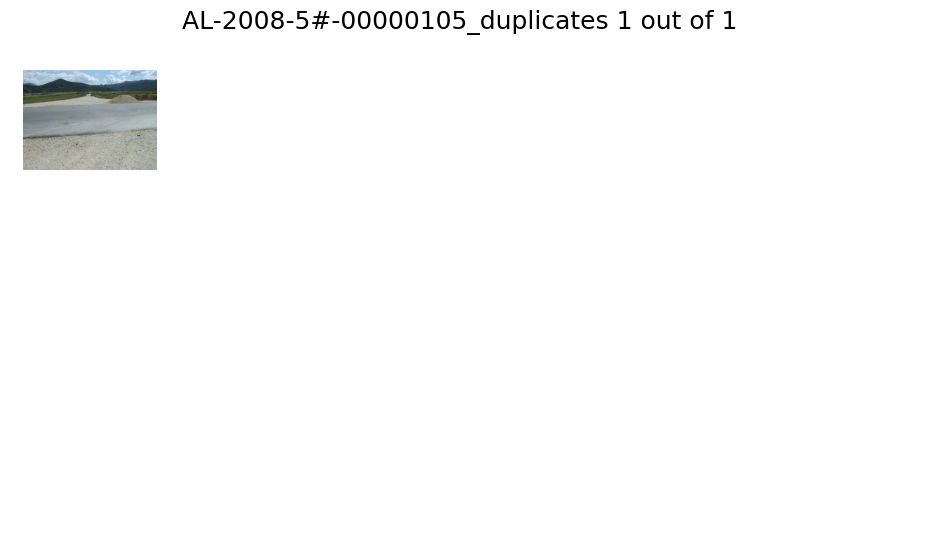

In [ ]:
    
    # Plot a histogram of these distances
    fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    n, bins, patches = ax.hist(distance_.flatten(), bins=100)
    ax.set_xlabel('Distance')
    ax.set_ylabel('Count')
    ax.set_title(f'Distance distribution for {dhsid_ea}')
    # fig.show()
    fig.savefig(f'C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/data_exploration/duplicates/{dhsid_ea}_distance_hist.png')
    plt.close()
    threshold = 15
    duplicates = (distance_ < threshold).any(dim=0)
    print(f'Number of duplicates: {duplicates.sum()}')

    if sum(duplicates) > 0:
        # plot these duplicates
        duplicates_idx = torch.where(duplicates)[0]
        duplicates_images = images.iloc[duplicates_idx]
        duplicates_images = duplicates_images['img_path_local'].apply(lambda x: plt.imread(x)).values

        # transpose images back transpose(2, 0, 1)
        duplicates_images = [x.transpose(2, 0, 1) for x in duplicates_images]
        save_dir = "C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/data_exploration/duplicates/"
        plot_street_images(duplicates_images, save_dir, title=f'{dhsid_ea}_duplicates {duplicates.sum()} out of {len(images)}')
        plt.close()
    # remove from metadata_all
    # get idxs of duplicates in the subset first
    duplicates_idx = torch.where(duplicates)[0]
    duplicates_images = images.iloc[duplicates_idx]
    # remove duplicate_images from metadata_all based on the index
    metadata_all = metadata_all[~metadata_all['img_path'].isin(duplicates_images['img_path'])]
    metadata_all_copy = metadata_all.copy()  # Update the copy for the next iteration

In [ ]:
# save metadata all as a csv
metadata_all.to_csv("C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/data_exploration/metadata_all.csv")

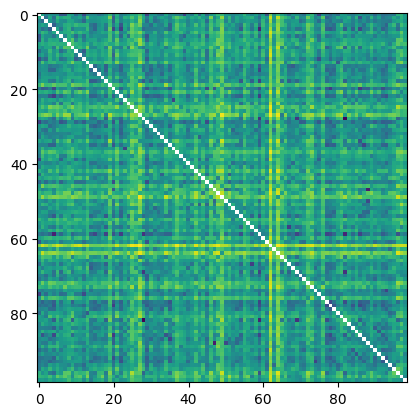

In [ ]:
# reshape distance into square matrix
plt.imshow(distance_)
# distance = distance.view(len(embeddings), len(embeddings))
# distance_ = distance
# import copy
distance = copy.copy(distance_)
threshold = 10


In [ ]:
distance

tensor([[    nan, 31.2517, 27.5570,  ..., 32.5830, 32.9470, 29.9848],
        [31.2517,     nan, 25.5939,  ..., 29.2679, 32.5297, 30.4076],
        [27.5570, 25.5939,     nan,  ..., 31.0607, 31.9362, 29.5317],
        ...,
        [32.5830, 29.2679, 31.0607,  ...,     nan, 33.1306, 30.3082],
        [32.9470, 32.5297, 31.9362,  ..., 33.1306,     nan, 28.3156],
        [29.9848, 30.4076, 29.5317,  ..., 30.3082, 28.3156,     nan]])

Number of duplicates: 6
Error plotting image 6, list index out of range
Error plotting image 7, list index out of range
Error plotting image 8, list index out of range
Error plotting image 9, list index out of range
Error plotting image 10, list index out of range
Error plotting image 11, list index out of range
Error plotting image 12, list index out of range
Error plotting image 13, list index out of range
Error plotting image 14, list index out of range
Error plotting image 15, list index out of range
Error plotting image 16, list index out of range
Error plotting image 17, list index out of range
Error plotting image 18, list index out of range
Error plotting image 19, list index out of range


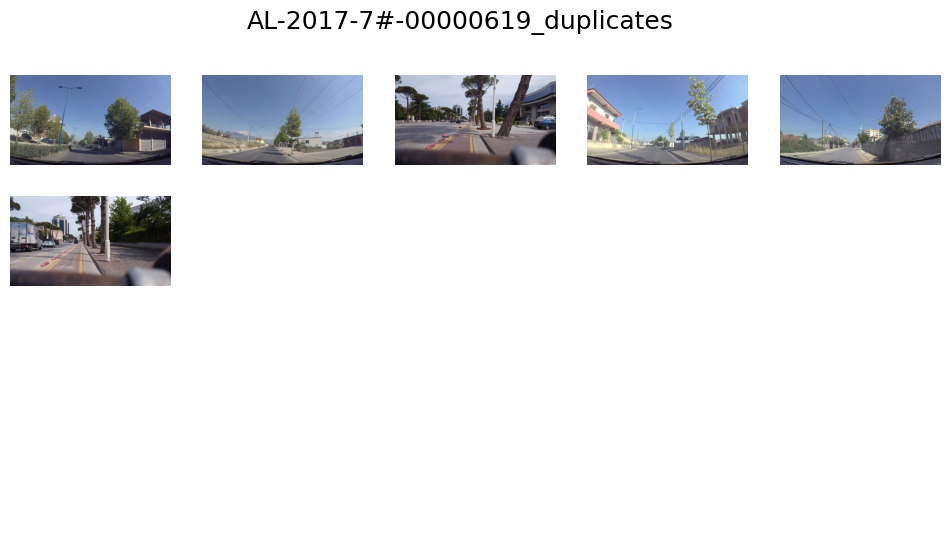

In [ ]:
if (distance < threshold).any(dim=0).sum() > 0:
    print("Duplicates found")
    # remove the duplicates
    duplicates = (distance < threshold).any(dim=0)
    duplicates_idx = torch.where(duplicates)[0]
    print(duplicates_idx)
    # remove the duplicates
    images = images[~duplicates_idx]
    print(f"Removed {len(duplicates_idx)} duplicates")

In [ ]:
images_removed = images[(distance < threshold).numpy()]


In [ ]:
len(metadata_all)

1680843

In [ ]:
9702/99

98.0

In [ ]:
images_removed[(distance < threshold).numpy()]

NameError: name 'images_removed' is not defined

In [ ]:
distance < threshold

tensor([False, False, False,  ..., False, False, False])

In [ ]:
bins

array([16.49687004, 16.74684906, 16.99682999, 17.24680901, 17.49678802,
       17.74676704, 17.99674797, 18.24672699, 18.49670601, 18.74668694,
       18.99666595, 19.24664497, 19.49662399, 19.74660492, 19.99658394,
       20.24656296, 20.49654388, 20.7465229 , 20.99650192, 21.24648285,
       21.49646187, 21.74644089, 21.99641991, 22.24640083, 22.49637985,
       22.74635887, 22.9963398 , 23.24631882, 23.49629784, 23.74627686,
       23.99625778, 24.2462368 , 24.49621582, 24.74619675, 24.99617577,
       25.24615479, 25.4961338 , 25.74611473, 25.99609375, 26.24607277,
       26.4960537 , 26.74603271, 26.99601173, 27.24599075, 27.49597168,
       27.7459507 , 27.99592972, 28.24591064, 28.49588966, 28.74586868,
       28.99584961, 29.24582863, 29.49580765, 29.74578667, 29.99576759,
       30.24574661, 30.49572563, 30.74570656, 30.99568558, 31.2456646 ,
       31.49564362, 31.74562454, 31.99560356, 32.24558258, 32.49556351,
       32.74554062, 32.99552155, 33.24550247, 33.49547958, 33.74

In [ ]:
cluster_images = df_cluster_images['img_path_local'].apply(lambda x: plt.imread(x)).values
cluster_images[0].transpose(2, 0, 1).shape
# plt.imshow(cluster_images[i])

(3, 576, 1024)

In [ ]:
closest_images

tensor([[ 0, 75, 29, 39, 12, 61],
        [ 1, 86, 20, 77,  2, 59],
        [ 2, 20, 12, 45, 75, 29],
        [ 3, 22,  4, 35, 93, 59],
        [ 4, 59, 22, 20, 86, 78],
        [ 5, 93, 14, 22, 32, 40],
        [ 6, 29,  0, 39, 22, 45],
        [ 7,  0, 29, 75, 12, 38],
        [ 8, 94, 32, 40, 14, 29],
        [ 9, 82, 77, 59, 86, 69],
        [10, 12, 29,  0, 39,  6],
        [11, 20, 45, 12, 29, 75],
        [12, 75,  0, 29, 10,  2],
        [13, 80, 66,  0, 29, 61],
        [14, 68, 59, 18, 22, 67],
        [15, 59, 18, 30, 22, 77],
        [16, 78, 29, 33, 92, 30],
        [17, 77, 29, 87, 35, 51],
        [18, 59, 54, 28, 14, 67],
        [19, 40, 93, 36, 14, 23],
        [20, 86, 78,  4, 45, 92],
        [21, 68, 57, 59, 97, 15],
        [22,  4, 59, 93,  3, 29],
        [23, 36, 85, 91, 16, 40],
        [24, 22, 54,  6, 71, 77],
        [25, 38, 89, 70, 29, 52],
        [26, 40, 68, 14, 90, 32],
        [27, 65, 18, 34, 69,  9],
        [28, 82, 59, 69, 18, 96],
        [29,  

In [ ]:
(result.labels == cluster).numpy()[0]

array([False,  True, False,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False,  True,  True,
       False, False,  True, False, False, False, False, False, False,
       False, False, False,  True, False, False,  True, False,  True,
       False, False, False, False, False,  True, False,  True, False,
       False, False, False, False, False, False,  True, False,  True,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True,  True,  True, False,
       False, False, False, False, False,  True,  True, False, False,
       False, False,  True,  True, False, False,  True, False, False])

In [ ]:
embeddings.shape

torch.Size([99, 1280])

Full batch converged at iteration 8/100 with center shifts = tensor([0.]).


In [ ]:
# plot resulting images for each cluster
# get the indices of the images in each cluster


ClusterResult(labels=tensor([[1, 0, 1, 0, 0, 0, 1, 1, 1, 3, 1, 1, 1, 1, 0, 0, 0, 0, 3, 0, 0, 2, 0, 0,
         0, 1, 1, 3, 3, 1, 0, 0, 0, 0, 3, 0, 0, 1, 1, 1, 0, 0, 1, 0, 2, 0, 1, 0,
         2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, 2, 1, 0, 1, 1, 3, 1, 0, 2, 3, 1, 1,
         1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 3, 0, 0, 0, 3, 0, 0, 1, 1, 0, 0, 0, 1, 1,
         0, 2, 0]]), centers=tensor([[[0.0220, 0.0749, 0.5323,  ..., 0.4055, 0.9893, 0.0000],
         [0.0000, 0.2873, 0.5564,  ..., 0.5113, 0.8980, 0.0000],
         [0.0000, 0.1764, 0.1352,  ..., 0.3727, 1.7967, 0.0000],
         [0.0000, 0.0000, 0.6407,  ..., 0.6668, 1.3700, 0.0000]]]), inertia=tensor([41591.5156]), x_org=tensor([[[0.0000, 0.0000, 0.0000,  ..., 1.8234, 0.3117, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.6515, 0.0000],
         [0.0000, 0.0000, 0.4914,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.7837,  ..., 0.2426, 1.2308, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 1.852

In [ ]:
res

In [ ]:

# save model output (image embeddings) into a torch tensor for each image according to idx
image_embeddings = torch.zeros(len(metadata_all), 1280)
location = torch.zeros(len(metadata_all), 2)

# iterate through the dataloader
for iterr, (idx, img, label) in tqdm(enumerate(dl_street)):
    output = model.forward_features(img) # or equivalently (without needing to set num_classes=0)
    output = model.forward_head(output, pre_logits=True) # 1280 features
    # save model output as image embeddding back into metadata_all according to idx
    # for i in range(len(idx)):
    #     try:
    #         metadata_all.loc[int(idx[i].numpy()), 'image_embedding'] = output[i]
    #     except:
    #         print("Error occured: ", metadata_all.loc[int(idx[i].numpy()), 'image_embedding'], output[i].shape)
    image_embeddings[idx] = output
    location[idx] = metadata_all.loc[idx, ['img_lat', 'img_lon']].values
    


: 

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torchvision import datasets, models
from torch.utils.data import DataLoader
from functools import partial
import time
from tqdm import tqdm
from torch.profiler import profile, record_function, ProfilerActivity

import argparse

import sys
sys.path.append('C:/UCL Coursework/Sem 1/COMP0173/sustainbench/dinov2')

from dinov2.eval.linear import create_linear_input
from dinov2.eval.linear import LinearClassifier
from dinov2.eval.utils import ModelWithIntermediateLayers

# parser = argparse.ArgumentParser(description='Fine-tune DINOv2 on ImageNet100')
# parser.add_argument('--arch', '-a', metavar='ARCH', default='dinov2_vitb14', choices=['dinov2_vitb14', 'dinov2_vitl14'],
#                     help='')
# parser.add_argument('--batch-size', '-b', default=128, type=int, metavar='N',
#                     help='mini-batch size (default: 128)')
# parser.add_argument('--log-dir', default='./', type=str, metavar='PATH',
#                     help='path to directory where to log (default: current directory)')
# parser.add_argument('--data-dir', required=True, type=str, metavar='PATH',
#                     help='path to the dataset')


# args = parser.parse_args()
# print(args)

arch = 'dinov2_vits14'
log_dir = "C:/UCL Coursework/Sem 1/COMP0173/sustainbench/baseline_models/datasets/experiment_results/logs"



if not os.path.exists(log_dir):
    os.makedirs(log_dir)


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

class Dino(nn.Module):
    def __init__(self, type):
        super().__init__()
        # get feature model
        model = torch.hub.load(
            "facebookresearch/dinov2", type, pretrained=True
        ).to(device)
        autocast_ctx = partial(
            torch.cuda.amp.autocast, enabled=True, dtype=torch.float16
        )
        self.feature_model = ModelWithIntermediateLayers(
            model, n_last_blocks=1, autocast_ctx=autocast_ctx
        ).to(device)

        with torch.no_grad():
            sample_input = torch.randn(1, 3, 224, 224).to(device)
            sample_output = self.feature_model(sample_input)

        # # get linear readout
        out_dim = create_linear_input(
            sample_output, use_n_blocks=1, use_avgpool=True
        ).shape[1]
        # self.classifier = LinearClassifier(
        #     out_dim, use_n_blocks=1, use_avgpool=True, num_classes=100
        # ).to(device)
        
        # Get linear readout for regression problem
        self.classifier = LinearClassifier(
            out_dim, use_n_blocks=1, use_avgpool=True, num_classes=1
        ).to(device)
        

    def forward(self, x):
        x = self.feature_model(x)
        x = self.classifier(x)
        return x

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

model = Dino(arch)

# Disable gradient for feature model
for param in model.feature_model.parameters():
    param.requires_grad = False
    
for param in model.classifier.parameters():
    param.requires_grad = True

# Define loss function for regression
criterion = nn.MSELoss()

# Observe that all parameters are being optimized
# optimizer = optim.SGD(model.classifier.parameters(), lr=0.001, momentum=0.9)
# optimizer for regression
optimizer = optim.Adam(model.classifier.parameters(), lr=0.001)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)


# inputs = torch.randn(4, 3, 224, 224).to(device)
# use stack only if no step
activities = [ProfilerActivity.CPU, ProfilerActivity.CUDA, ProfilerActivity.XPU]
with profile(activities=activities) as prof:

    inputs, labels = next(iter(dl))
    inputs = inputs.to(device)
    labels = labels.to(device)
    
    model(inputs)

prof.export_chrome_trace("trace.json")


Using cache found in C:\Users\User/.cache\torch\hub\facebookresearch_dinov2_main


In [ ]:
import wandb
wandb.init(project='sustainbench', entity='sustainbench')
# wandb.init(project=f"project-nn-search-{N}-{timenow}", config={"system.monitor": False}, reinit = True, id=f"nn_{[f"{h:2.2f}" for h in hyperparams]}")

# Train the model
num_epochs = 25
wandb.config.epochs = num_epochs
best_acc = 0.0
for epoch in range(num_epochs):
    print('Epoch {}/{}'.format(epoch, num_epochs - 1))
    print('-' * 10)
    

    for phase in ['train', 'val']:
        start_time = time.time()
        if phase == 'train':
            model.feature_model.eval()
            model.classifier.train()
        else:
            model.feature_model.eval()
            model.classifier.eval()

        running_loss = 0.0
        
        # iterate over dl
        for inputs, labels in tqdm(dl):
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            
            with torch.no_grad():
                features = model.feature_model(inputs)

            with torch.set_grad_enabled(phase == 'train'):
                outputs = model.classifier(features)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            
        epoch_loss = running_loss / len(dl.dataset)
        
        end_time = time.time()
        time_elapsed = end_time - start_time
        print('{} Loss: {:.4f} Acc: {:.4f} Time: {:.0f}m {:.0f}s'.format(phase, epoch_loss, time_elapsed // 60, time_elapsed % 60)) # Modify this line
        wandb.log({
            "phase": phase,
            "epoch_loss": epoch_loss,
            "time_elapsed":   time_elapsed,
        })
        
        
        if phase == 'val' and loss > best_loss:
            best_loss = loss
            torch.save(model.state_dict(), os.path.join(log_dir, 'best_model.pth'))

print('Training complete')


Epoch 0/24
----------


  0%|          | 8/13139 [01:45<46:05:04, 12.63s/it]

: 

In [ ]:
# your model building code goes here

# FOR STREET LEVEL IMAGES
# Import DinoV2 as backbone
# This should take stacks of 20 street level images and output a vector of 3: wealth index, sanitation index, confidence, these are [0,1]

# Then import a VLM (gemini) and run it on the same 20 images, ask chatgpt to rank each image based on the 
# wealth index, sanitation index, confidence of fixed == 1

# Then train a model to predict the wealth index, sanitation index, confidence based on the image :O maybe next step but for now


# Train a DinoV2 to take in 7-band satelite images and output the same 3: wealth index, sanitation index, confidence, these are [0,1]

# Then combine these three based on the confidence to get the final wealth index and sanitation index
# Combination can be a simple weighted average based on the confidence
# Then compare with the ground truth wealth index and sanitation index
# These models are trained together (all three run inference during training)

# The two Dinos will learn to extract features from the images that are useful for the wealth index, sanitation index, confidence
# The two Dinos will also learn to weigh their own confidence against each other and VLM's confidence

# We will update the VLM's 'weights' via confidence




<span style='color:red'> **[Your insights go here. To be completed by you]** </span>

### 5. Experimental analysis (performance & scalability) (20%)

**Guidelines**: Test your model here. You can do hyper-parameter tuning and any ablation studies you consider important. How does your model perform? Is there any room for improvement? If so, what do you think it's needed? Comment as well on how does the model compare to previous baselines (yours or from the literature). Do you think model's performance is enough for the application that you are aiming to address? Is the model scalable to a real-world application? Is training data enough for such an application? How does the model's performance compare to a more/less computationally heavy model? Some of these questions may be more or less relevant depending on your application, so we leave it up to you to decide which factors in terms of performance and scalability you consider most important to evaluate.


In [ ]:
# your experimental study here

<span style="color:red; font-weight:bold;">

</span>

### 6. Ethical considerations (15%)

**Guidelines**: Analyse and discuss the ethical dimensions of the application: bias, fairness, interpretability, etc. Some of these may not be relevant, but we leave this for you to decide which ones would be the relevant ones to consider for the problem at hand. Here you could do a sensitivity/interpretability analysis of the model, to study the effect of different variables or examine whether there are any biases (e.g. the model performs best for certain group of examples in your dataset). You could also link this part with your exploratory data analysis, focusing on the ethical dimensions of the dataset rather than the model you built. Justify what your analysis tell us about these ethical dimensions. 

In [ ]:
# your analysis goes here


 link this part with your exploratory data analysis, focusing on the ethical dimensions of the dataset rather than the model you built. Justify what your analysis tell us about these ethical dimensions. 

bias, fairness, interpretability

sensitivity/interpretability analysis


### 7. Sustainable development relevance & impact (15%)

**Guidelines**: Discuss what are the current challenges surrounding this dataset in terms of sustainable development and how can ML help overcome them? Additionally, bring out all of the things you have managed to do and understand from the experiments and connect them to sustainable development. Discuss what are the challenges of deploying such a model and how it could impact our progress towards achieving the sustainable development goals. 


<span style="color:red; font-weight:bold;">
I think in terms of sustainable development, 

</span>
